In [1]:
import scanpy as sc
import scanpy.external as sce
#import scvelo as scv
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
from pathlib import Path
from sklearn.metrics.pairwise import cosine_distances
#from mousipy import translate

import matplotlib.font_manager
import openpyxl
import pyreadr
import rpy2
#from rpy2.robjects.packages import importr
#import rpy2.robjects as robjects
# import seaborn as sns
# import palantir
# import loompy
# import feather
# import re
# from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)
import matplotlib.lines as lines

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

#scv.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True, format='pdf')

pd.set_option('display.max_rows', 200)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/brandonng/opt/anaconda3

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.22.3 scipy==1.5.3 pandas==2.0.0 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.10


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/umap/umap_.py:660: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [2]:
# import pkg_resources
# pkg_resources.require("numpy==1.23.5")
# import numpy

In [3]:
import muon as mu
import muon.prot as pt
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.22.3 scipy==1.5.3 pandas==2.0.0 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.10


In [4]:
# pip install scvelo==0.2.5

In [5]:
#import sys
#!{sys.executable} -m pip install scikit-learn==1.2.1

In [6]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)

In [7]:
import os

os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Resources'

In [8]:
%load_ext rpy2.ipython

%R if (!require("pacman")) install.packages("pacman")
%R pacman::p_load(MAST, scales, data.table, openxlsx, ggplot2, ggpubr, RColorBrewer, dichromat, readxl, ggpubr, pheatmap, dplyr, arrow, feather, DelayedArray, HDF5Array, stringr, parallel)

Loading required package: pacman


1,1,1,...,1,1,1


`%matplotlib inline` is a magic command that renders the figures within the notebook. For more information regarding python's magic operators, see https://ipython.readthedocs.io/en/stable/interactive/magics.html.

In [9]:
%matplotlib inline 

To get you started in a visually pleasing way, here are some manually curated color palettes. Feel free to use the ones provided here, the python predefined ones here (https://matplotlib.org/stable/tutorials/colors/colormaps.html) or make up your own.

In [10]:
# divergent
user_defined_palette =  [ '#3283FE', '#16FF32', '#F6222E',  '#FEAF16', '#BDCDFF', '#3B00FB', '#1CFFCE', '#C075A6', '#F8A19F', '#B5EFB5', '#FBE426', '#C4451C', '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F', '#1C8356', '#0e452b', '#AA0DFE', '#B5EFB5', '#325A9B', '#90AD1C']
# gradient of one color
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
# gradient of two colors
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

💡 **Hint:** Use the code below ONLY if you need to install extra packages

In [11]:

# !{sys.executable} pip install xlsxwriter
# !{sys.executable} pip install rpy2
import xlsxwriter
import rpy2

In [12]:
path_to_h5ad = '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/20230508_MM_IL-18_singlecell.h5ad'

In [13]:
# code to read back your saved h5ad object
adata = sc.read_h5ad(path_to_h5ad)
adata.uns['log1p']["base"] = None

In [43]:
# rng = np.random.RandomState(42)
# adata = sc.tl.pca(adata, n_comps=60, copy = True, svd_solver='arpack', random_state=rng, use_highly_variable=True)


computing PCA
    on highly variable genes
    with n_comps=60
    finished (0:00:06)


In [14]:
# # re-run leiden clustering
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(adata, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:05)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:05)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:08)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:10)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:05)
running Leiden cluste

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


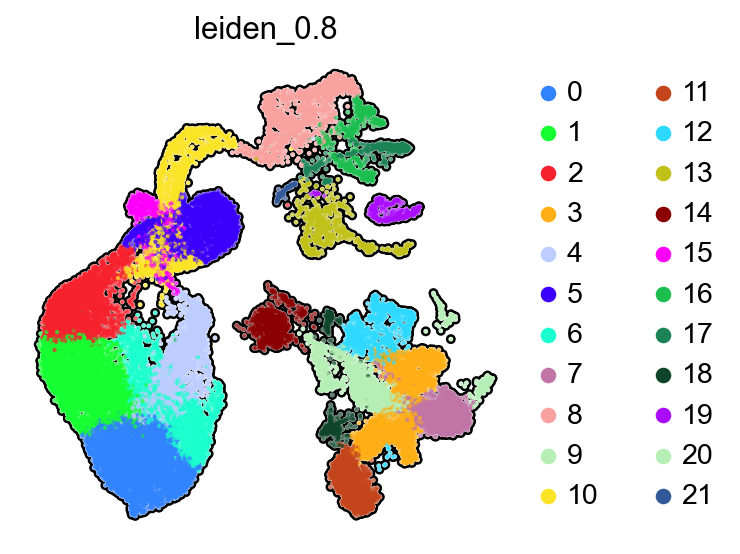

In [15]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=['leiden_0.8'], 
    use_raw=False,
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    ncols=5,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [16]:
marker_genes = ['Ptprc', 'Cd3e', 'Cxcr6', 'Cd4', 'Cd8a', 'Foxp3', 'Itgam', 'Ly6c1', 'Ly6g', 'Adgre1', 'Cd68', 'Mertk', 'Itgax', 'Zbtb46', 'Flt3', 'Cd19', 'Ncr1', 'Ncam1']

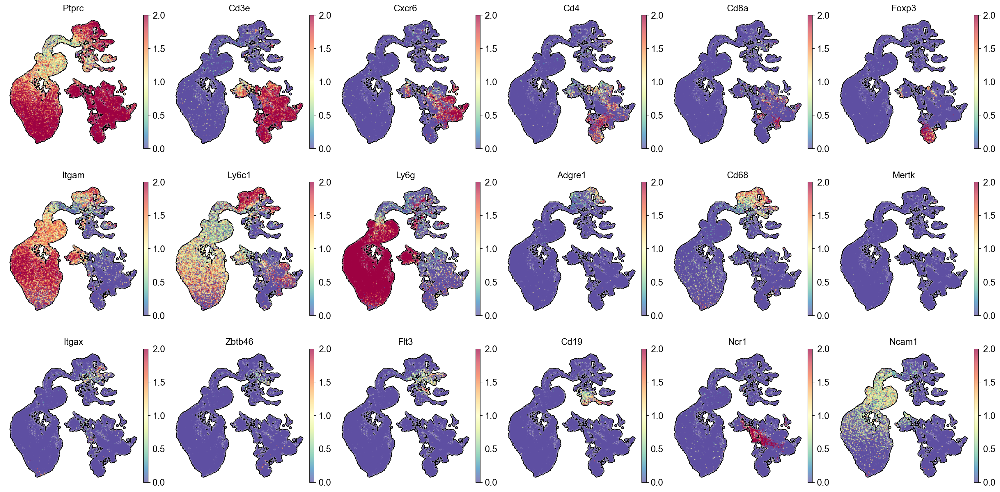

In [18]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    adata, 
    color=marker_genes, 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False,
    vmax=2
)

In [16]:
# to redo clustering within only one cell type, the subsequent analyses and plots will use "Tcells" in place of "adata"
# they need to be separate entries per cell type, (might need to be done with adata first and not mdata)
Mac_mono = adata[(adata.obs['leiden_0.8']=='8')]

In [30]:
sc.pp.highly_variable_genes(Mac_mono, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [31]:
# rerun PCA for new cell type
rng = np.random.RandomState(42)
Mac_mono = sc.tl.pca(Mac_mono, n_comps=200, copy = True, svd_solver='arpack', random_state=rng, use_highly_variable=True)


computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:02)


<function matplotlib.pyplot.show(close=None, block=None)>

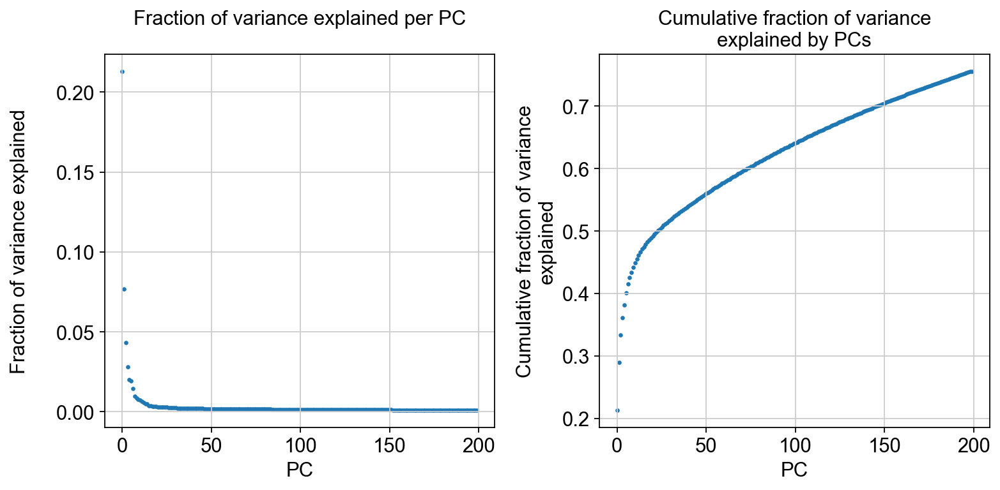

In [32]:
observe_variance(Mac_mono)

In [33]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(Mac_mono, n_comps=30, svd_solver='arpack', random_state=rng, use_highly_variable=True)
sc.pp.neighbors(Mac_mono, n_neighbors=15)
sc.tl.umap(Mac_mono)

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [15]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(Mac_mono, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

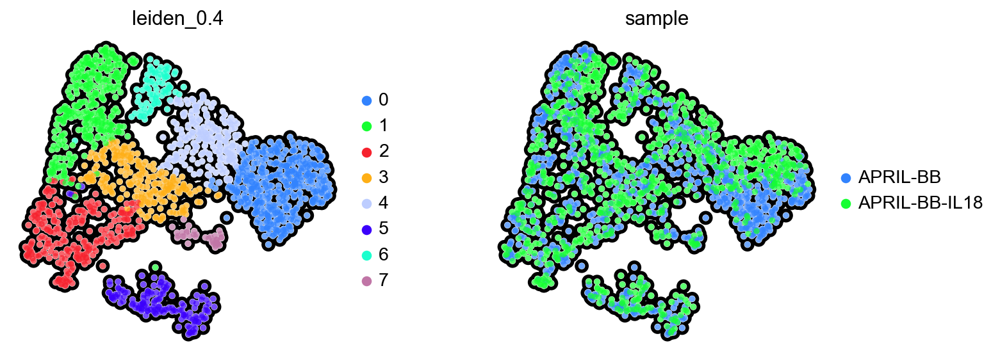

In [16]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    Mac_mono, 
    color=['leiden_0.4', 'sample'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [54]:
#to add group and HTO distinctions
Mac_mono.obs['distinct'] = ''
Mac_mono.obs['distinct'] = Mac_mono.obs[['sample', 'hash_id']].agg(' '.join, axis=1)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


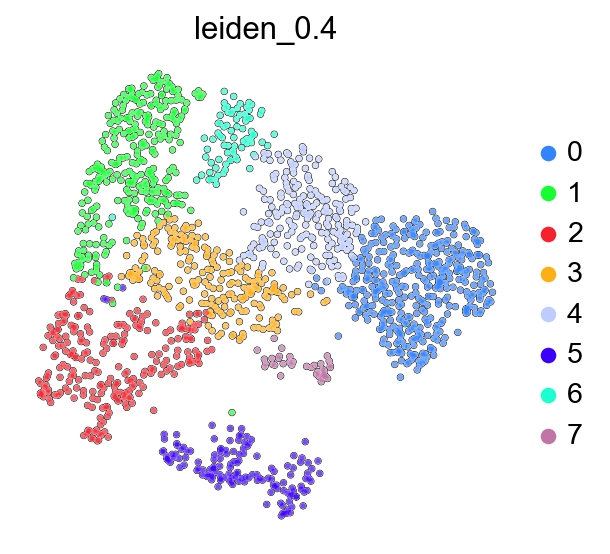

In [141]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    Mac_mono, 
    color='leiden_0.4', 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.1, 0.05],
    size=25,
    frameon=False,
    add_outline=True,
    sort_order = False,
    save="_Mac_mono_leiden0_4.pdf"
)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


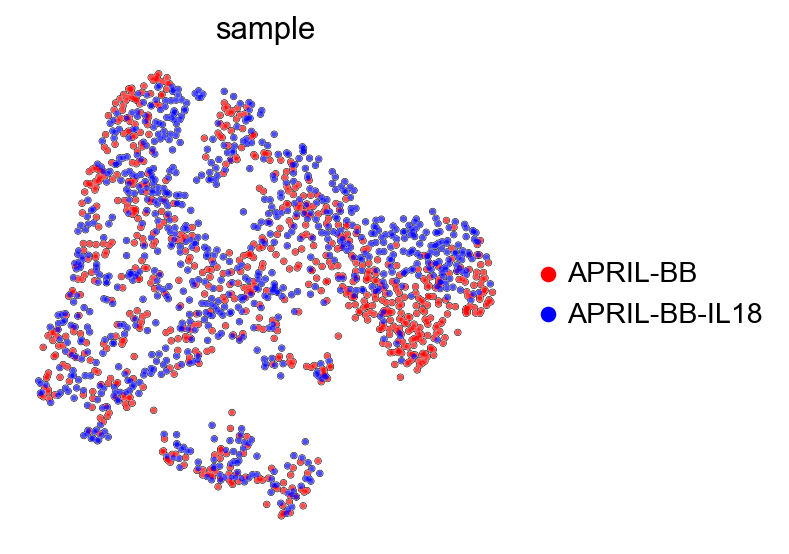

In [140]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    Mac_mono, 
    color='sample', 
    palette=['red', 'blue'],  
    color_map='coolwarm', 
    use_raw=False,
    ncols=6,
    wspace = 0.1,
    outline_width=[0.1, 0.05],
    size=25,
    frameon=False,
    add_outline=True,
    sort_order = False,
    save="_Mac_mono_by_sample.pdf"
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


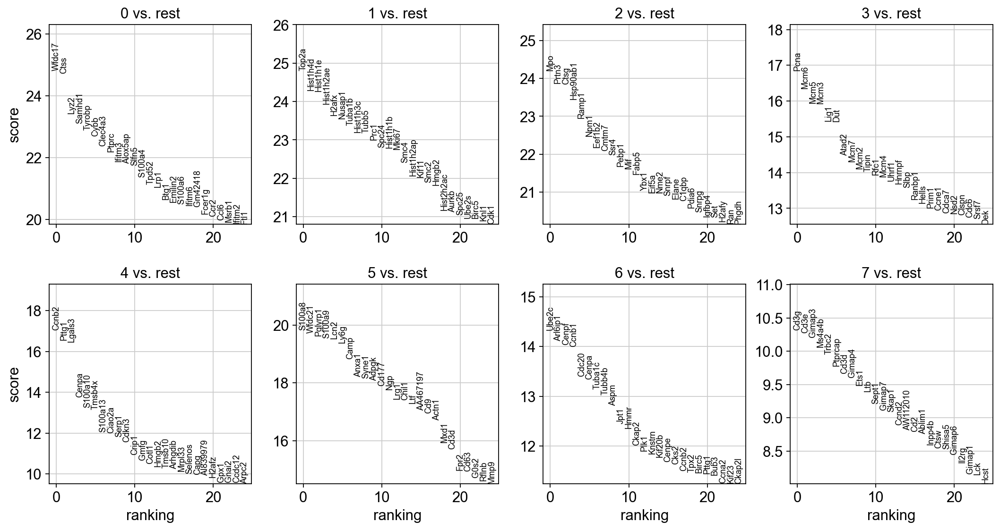

In [50]:
sc.tl.rank_genes_groups(Mac_mono, 'leiden_0.4', method='wilcoxon', use_raw=False)
sc.pl.rank_genes_groups(Mac_mono, n_genes=25, sharey=False)

In [39]:
# create new adata for each biological group
Mac_mono_APRIL_BB = Mac_mono[(Mac_mono.obs['sample']=='APRIL-BB')]
Mac_mono_APRIL_BB_IL18 = Mac_mono[(Mac_mono.obs['sample']=='APRIL-BB-IL18')]


In [40]:
Mac_mono_APRIL_BB.shape

(795, 22956)

In [41]:
Mac_mono_APRIL_BB_IL18.shape

(849, 22956)

In [12]:
Mac_mono_to_h5ad = '../2022-12-21 APRIL BB IL-18 single cell experiment/Mac_mono.h5ad'


In [13]:
# Mac_mono.write(Mac_mono_to_h5ad)

In [14]:
# code to read back your saved h5ad object
Mac_mono = sc.read_h5ad(Mac_mono_to_h5ad)
Mac_mono.uns['log1p']["base"] = None

In [30]:
# to get gene list for defining unclear clusters (first need to run sc.tl wilcox)


writer = pd.ExcelWriter('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/Mac_mono_wilcox_leiden_0_4.xlsx', engine='xlsxwriter')

sc.tl.rank_genes_groups(Mac_mono, 'leiden_0.4', method='wilcoxon', use_raw=False)
result = Mac_mono.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name='Mac_mono')
        
# writer.save()
writer.close()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [71]:
# it can also be saved as an excel for GSEA
writer = pd.ExcelWriter('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/Mac_mono_wilcox2.xlsx', engine='xlsxwriter')

sc.tl.rank_genes_groups(Mac_mono, 'sample', method='wilcoxon', use_raw=False)
result = Mac_mono.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name='Mac_mono')
        
# writer.save()
writer.close()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [214]:
Mac_mono_genes_combined_short = ['B2m', 'H2-D1', 'H2-K1', 'Tap1', 'Psma2', 'Psma3', 'Isg15', 'Ifi44', 'Irf1', 'Irf7', 'Stat1',
                                 'Tgfb1', 'Stat3', 'Stat6', 'Kdm6b', 'Sell', 'Hif1a', 
                                 'Nlrc5', 'Zbp1', 'Ly6c2', 'Parp11', 'Parp12', 'Aldoa', 'Pfkp', 'Sec13', 'Pgk1',
                                 'Nup98']

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


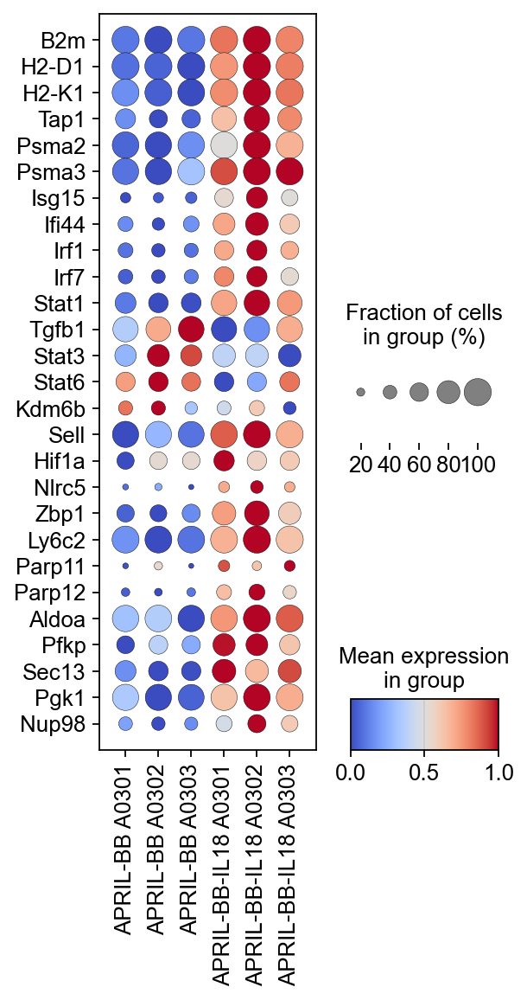

In [217]:
sc.pl.dotplot(Mac_mono, Mac_mono_genes_combined_short, groupby='distinct', cmap='coolwarm', 
              figsize=(3.7,7), 
              standard_scale='var', swap_axes=True, use_raw=False,
             save="Mac_mono_combined_phenotypes_short2.pdf"
             )

In [ ]:
#Gsea analysis with gseapy

In [15]:
import gseapy
from matplotlib import pyplot as plt

In [100]:
sc.tl.rank_genes_groups(Mac_mono, 'sample', method='wilcoxon', use_raw=False, key_added = "wilcoxon")
result = Mac_mono.uns['rank_genes_groups']
groups = result['names'].dtype.names

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [101]:
# plotting GSEA results together from rank list using gseapy

In [18]:
df = pd.read_csv('/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/Mac_mono_wilcox2_rnk.txt',
                 sep='\t', header=0)


In [19]:
df

,#primer_id,#rank_score
0,Psmb9,21.702213
1,Psmb8,20.964403
2,H2-D1,20.010353
3,H2-K1,19.733660
4,B2m,18.705540
...,...,...
22951,Ltf,-11.948441
22952,Retnlg,-14.017367
22953,Ngp,-14.037068
22954,Camp,-16.268435


In [20]:
Mac_mono_pre_res_GO_BP = gseapy.prerank(df, min_size=10, seed = 42,
                                gene_sets='/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/GO_BP/m5.go.bp.v2023.1.Mm.symbols.gmt')


2023-08-30 00:20:03,655 [WARNING] Duplicated values found in preranked stats: 49.15% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [21]:
Mac_mono_pre_res_GO_BP_1 = Mac_mono_pre_res_GO_BP

In [22]:
Mac_mono_pre_res_GO_BP_1.res2d.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_CELL_AGGREGATION,-0.946376,-1.954583,0.0,0.076604,0.027,2/18,0.68%,Ltf;Mapk14
1,prerank,GOBP_PEPTIDE_CROSS_LINKING,-0.75794,-1.889409,0.0,0.165519,0.108,11/38,6.68%,Fn1;Cstdc5;Abca7;Cstdc4;F13a1;Stfa2l1;Stfa2;St...
2,prerank,GOBP_GRANULOCYTE_ACTIVATION,-0.730996,-1.887464,0.0,0.113082,0.111,22/47,7.63%,Camp;Ccr2;Tyrobp;Cd177;Itgam;Cd300a;Kmt2e;Itgb...
3,prerank,GOBP_POSITIVE_REGULATION_OF_MYELOID_LEUKOCYTE_...,-0.686921,-1.883296,0.0,0.097807,0.129,29/68,8.74%,Fos;Ccl9;Tyrobp;Itgam;Ppp3ca;Csf1r;Id2;Ccl5;Gn...
4,prerank,GOBP_REGULATION_OF_OSTEOCLAST_DIFFERENTIATION,-0.674533,-1.877728,0.0,0.085906,0.139,32/79,8.82%,Fos;Ccl9;Tyrobp;Pirb;Ppp3ca;Csf1r;Mafb;Inpp5d;...
5,prerank,GOBP_GLOMERULUS_DEVELOPMENT,-0.703808,-1.866895,0.0,0.093019,0.179,19/63,9.94%,Il6ra;Ppp3ca;Sulf2;Mef2c;Asxl1;Cd24a;Ahr;Cfh;C...
6,prerank,GOBP_REGULATION_OF_MYELOID_LEUKOCYTE_DIFFERENT...,-0.628806,-1.851606,0.0,0.110607,0.233,50/134,8.82%,Fos;Ccl9;Tyrobp;Itgam;Foxp1;Pirb;Ppp3ca;Csf1r;...
7,prerank,GOBP_LYMPH_VESSEL_MORPHOGENESIS,-0.820921,-1.844097,0.0,0.115248,0.267,3/24,5.08%,Ngp;Bmpr2;Nfatc1
8,prerank,GOBP_SPECIFICATION_OF_ANIMAL_ORGAN_IDENTITY,-0.782215,-1.842049,0.0,0.107002,0.279,4/30,4.57%,Mef2c;Rbpj;Ctnnb1;Ext1
9,prerank,GOBP_ORGAN_OR_TISSUE_SPECIFIC_IMMUNE_RESPONSE,-0.76771,-1.838565,0.0,0.102868,0.296,5/29,3.38%,Camp;Ltf;Fau;Cfh;Tnfsf13


In [23]:
Mac_mono_pre_res_GO_BP_1_sorted = Mac_mono_pre_res_GO_BP_1.res2d.sort_values('FDR q-val', ascending = True).reset_index(drop = True)


In [24]:
Mac_mono_pre_res_GO_BP_1_sorted.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.910642,1.758193,0.0,0.0,0.0,20/43,4.69%,H2-D1;H2-K1;B2m;Tap1;H2-T23;H2-Q7;H2-T22;Fcgr1...
1,prerank,GOBP_CELLULAR_RESPONSE_TO_INTERFERON_BETA,0.868521,1.714563,0.0,0.0,0.0,30/57,6.58%,Stat1;Ifi47;Gbp7;Ifi204;Gbp2b;Irgm1;Igtp;Gbp2;...
2,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_VIA_M...,0.911911,1.696242,0.0,0.0,0.0,12/32,3.80%,H2-D1;H2-K1;B2m;H2-T23;H2-Q7;H2-T22;H2-Q6;H2-Q...
3,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.850256,1.695971,0.0,0.0,0.0,22/63,4.69%,H2-D1;H2-K1;B2m;Tap1;H2-T23;H2-Q7;H2-T22;Fcgr1...
4,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EN...,0.916374,1.725637,0.0,0.0,0.0,16/35,4.69%,H2-D1;H2-K1;B2m;Tap1;H2-T23;H2-Q7;H2-T22;H2-Q6...
5,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION,0.814966,1.675581,0.0,0.000253,0.001,31/111,6.09%,Psmb9;Psmb8;H2-D1;H2-K1;B2m;Psme2;Psme1;Tap1;H...
6,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EX...,0.883005,1.658686,0.0,0.000325,0.002,12/33,2.16%,H2-K1;B2m;Psme2;Psme1;Tap1;Fcgr1;H2-M3;Tapbp;H...
7,prerank,GOBP_RESPONSE_TO_INTERFERON_BETA,0.813176,1.631338,0.0,0.002088,0.018,33/69,6.58%,Stat1;Ifi47;Bst2;Gbp7;Ifi204;Gbp2b;Irgm1;Igtp;...
8,prerank,GOBP_REGULATION_OF_T_CELL_MEDIATED_CYTOTOXICITY,0.839767,1.625988,0.0,0.002699,0.028,14/49,3.80%,H2-D1;H2-K1;B2m;Pnp;H2-T23;H2-Q7;H2-T22;H2-Q6;...
9,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EX...,0.876398,1.594731,0.0,0.008626,0.103,9/27,0.70%,H2-K1;B2m;Tap1;Fcgr1;H2-M3;Tapbp;H2-DMa;Tap2;I...


In [25]:
Mac_mono_pre_res_GO_BP_sorted_path = "/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/Mac_mono_GSEApy_GO_BP.csv"
Mac_mono_pre_res_GO_BP_1_sorted.to_csv(Mac_mono_pre_res_GO_BP_sorted_path)


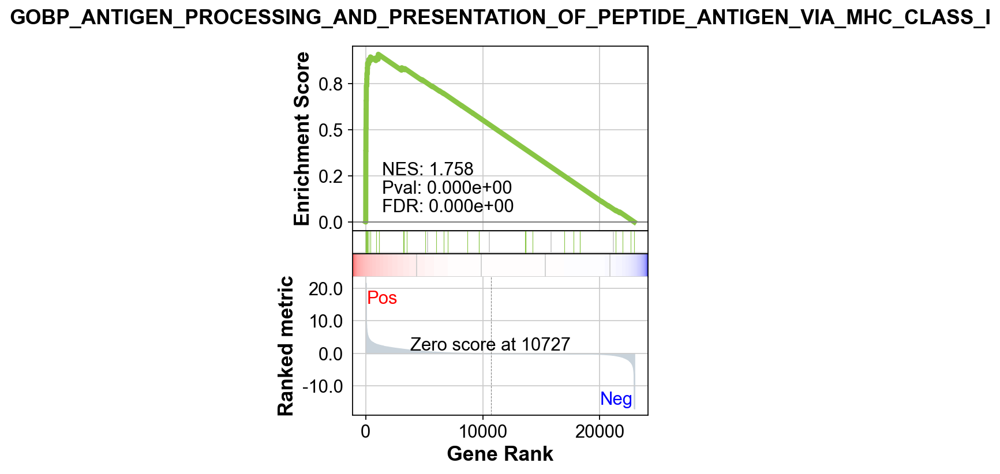

In [27]:
terms = Mac_mono_pre_res_GO_BP_1_sorted.Term
axs = Mac_mono_pre_res_GO_BP.plot(terms=terms[0]) # v1.0.5

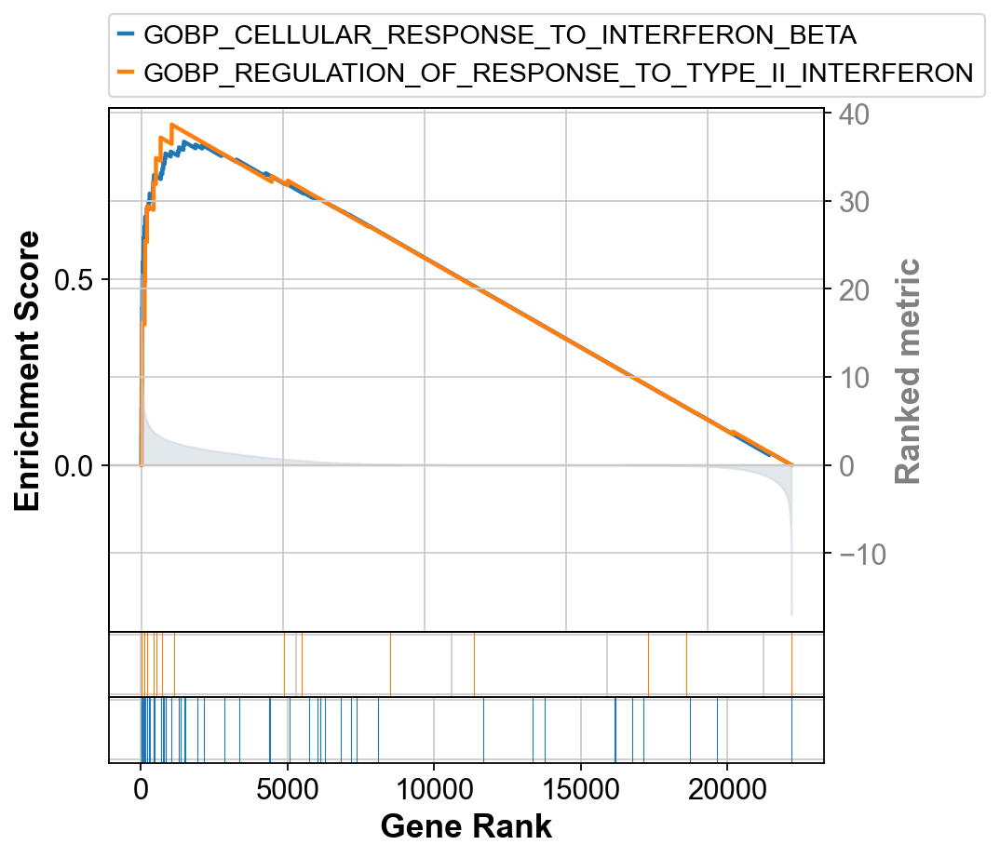

In [30]:
axs = Mac_mono_pre_res_GO_BP.plot(terms=[terms[1], terms[15]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(3,4)
                  )

axs.savefig("Mac_mono_GSEApy_GO_BP_interferon_response.pdf", bbox_inches = 'tight')

In [83]:
#create custom GSEA list
Mac_mono_pre_res_GO_BP_1_sorted_custom_list = pd.concat([Mac_mono_pre_res_GO_BP_1_sorted[terms==terms[26]],
                                                         Mac_mono_pre_res_GO_BP_1_sorted[terms==terms[27]],
                                                           Mac_mono_pre_res_GO_BP_1_sorted[terms==terms[32]],
                                                           Mac_mono_pre_res_GO_BP_1_sorted[terms==terms[34]],
                                                           Mac_mono_pre_res_GO_BP_1_sorted[terms==terms[53]]],
                                                        ignore_index=True
                                                          )

In [84]:
Mac_mono_pre_res_GO_BP_1_sorted_custom_list

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_REGULATION_OF_MAST_CELL_ACTIVATION,0.790853,2.044322,0.0,0.001274,0.003,16/55,4.46%,Fcer1g;Lilrb4a;Lyn;Cd300a;Ptpre;Fgr;Cd84;Cd300...
1,prerank,GOBP_REGULATION_OF_LEUKOCYTE_DEGRANULATION,0.794528,2.075678,0.0,0.001274,0.002,18/54,2.88%,Fcer1g;Ccr2;Itgam;Lyn;Cd300a;Itgb2;Fgr;Lamp1;C...
2,prerank,GOBP_RESPONSE_TO_INTERFERON_BETA,0.756706,2.049939,0.0,0.001434,0.003,28/69,5.67%,Ifitm3;Ifitm6;Ifitm2;Ifi203;Ifi207;Ifi204;Ifi2...
3,prerank,GOBP_PHAGOCYTOSIS_ENGULFMENT,0.807452,2.08353,0.0,0.001529,0.002,20/58,2.96%,Fcer1g;Itgam;Fcgr3;Sirpa;Cd300a;Itgb2;C3;Msr1;...
4,prerank,GOBP_NEGATIVE_REGULATION_OF_INTERLEUKIN_10_PRO...,0.911118,2.007944,0.0,0.003277,0.012,7/21,1.53%,Tyrobp;Lilrb4a;Vsir;Mmp8;Cd84;Tnfrsf21;Fcgr2b


<Axes: title={'center': 'GO_Biological_Process_2023'}, xlabel='$- \\log_{10}$ (FDR q-val)'>

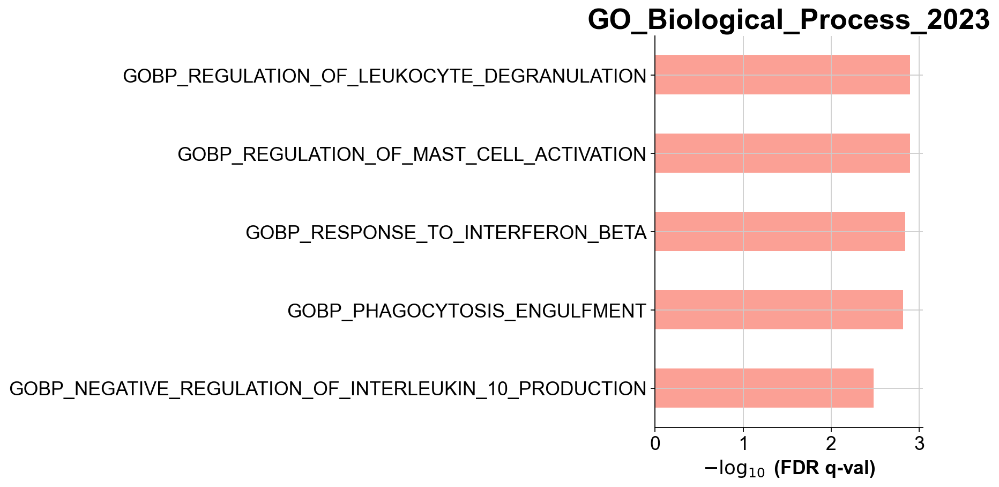

In [87]:
gseapy.barplot(Mac_mono_pre_res_GO_BP_1_sorted_custom_list, column = 'FDR q-val', cutoff = 0.05, top_term=5, title='GO_Biological_Process_2023',
#               save="Mac_mono_leiden_0.4_cluster0_gseapy_GO_BP.pdf"
              )

In [ ]:
# now for M2_canonical pathways

In [31]:
Mac_mono_pre_res_CP = gseapy.prerank(df, min_size=10, seed = 42,
                                gene_sets='/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/biocarta_CP/m2.cp.v2023.1.Mm.symbols.gmt')


2023-08-30 00:37:17,410 [WARNING] Duplicated values found in preranked stats: 49.15% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [32]:
Mac_mono_pre_res_CP_1 = Mac_mono_pre_res_CP

In [33]:
Mac_mono_pre_res_CP_1.res2d.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_ANTIMICROBIAL_PEPTIDES,-0.776589,-1.943519,0.0,0.023016,0.011,8/43,0.51%,S100a9;Camp;Ltf;Lcn2;S100a8;Pglyrp1;Tlr2;Lyz2
1,prerank,REACTOME_PHOSPHORYLATION_OF_CD3_AND_TCR_ZETA_C...,-0.897589,-1.921409,0.0,0.018221,0.018,15/21,8.20%,Ptprc;Trbc2;Trbc1;Cd3e;Ptpn22;Ptprj;Cd3g;Lck;H...
2,prerank,REACTOME_NCAM1_INTERACTIONS,-0.932603,-1.911765,0.0,0.015983,0.024,1/15,0.07%,St8sia4
3,prerank,REACTOME_COLLAGEN_DEGRADATION,-0.72747,-1.887075,0.0,0.021577,0.042,5/50,5.23%,Ctsd;Mmp9;Mmp8;Ctsb;Ctsl
4,prerank,REACTOME_MOLECULES_ASSOCIATED_WITH_ELASTIC_FIBRES,-0.797972,-1.885725,0.0,0.017645,0.043,5/30,4.46%,Fn1;Tgfb1;Itgb1;Itga8;Itgav
5,prerank,REACTOME_TRANSLOCATION_OF_ZAP_70_TO_IMMUNOLOGI...,-0.891971,-1.866074,0.0,0.020778,0.058,12/18,7.73%,Trbc2;Trbc1;Cd3e;Ptpn22;Cd3g;Lck;H2-Ab1;Cd247;...
6,prerank,REACTOME_NON_INTEGRIN_MEMBRANE_ECM_INTERACTIONS,-0.768311,-1.825763,0.0,0.037538,0.114,4/29,4.46%,Fn1;Tgfb1;Itgb1;Itgav
7,prerank,REACTOME_DEFENSINS,-0.876826,-1.815486,0.0,0.039558,0.136,2/17,4.16%,Tlr2;Tlr1
8,prerank,WP_SEROTONIN_AND_ANXIETY,-0.912336,-1.790416,0.0,0.053917,0.197,5/13,2.65%,Fos;Eef2;Ppp3ca;Plek;Prkcb
9,prerank,WP_EDA_SIGNALING_IN_HAIR_FOLLICLE_DEVELOPMENT,-0.826198,-1.726616,0.005076,0.135793,0.451,6/16,8.09%,Ltb;Nfkb1;Relb;Nfkb2;Rela;Rel


In [34]:
Mac_mono_pre_res_CP_1_sorted = Mac_mono_pre_res_CP_1.res2d.sort_values('FDR q-val', ascending = True).reset_index(drop = True)


In [75]:
# gseapy.gseaplot(rank_metric=res.ranking, term=terms[13], **res.results[terms[13]],
               
#                )

In [35]:
Mac_mono_pre_res_CP_1_sorted.head(200)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_MITOTIC_G1_PHASE_AND_G1_S_TRANSITION,0.799384,1.667357,0.0,0.0,0.0,84/127,11.17%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
1,prerank,REACTOME_APC_C_CDH1_MEDIATED_DEGRADATION_OF_CD...,0.835691,1.687472,0.0,0.0,0.0,49/73,8.44%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
2,prerank,REACTOME_UBIQUITIN_MEDIATED_DEGRADATION_OF_PHO...,0.861665,1.685176,0.0,0.0,0.0,41/51,9.20%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
3,prerank,REACTOME_DEGRADATION_OF_AXIN,0.857934,1.684686,0.0,0.0,0.0,40/54,9.20%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
4,prerank,REACTOME_HEDGEHOG_LIGAND_BIOGENESIS,0.848356,1.683511,0.0,0.0,0.0,43/62,9.79%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
5,prerank,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_RUNX2,0.846315,1.681335,0.0,0.0,0.0,45/61,9.20%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
6,prerank,REACTOME_REGULATION_OF_RAS_BY_GAPS,0.841694,1.681296,0.0,0.0,0.0,45/66,9.20%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
7,prerank,REACTOME_CYCLIN_A_CDK2_ASSOCIATED_EVENTS_AT_S_...,0.834293,1.678901,0.0,0.0,0.0,49/70,9.63%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
8,prerank,REACTOME_DECTIN_1_MEDIATED_NONCANONICAL_NF_KB_...,0.854545,1.678383,0.0,0.0,0.0,42/56,9.20%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...
9,prerank,REACTOME_DEGRADATION_OF_DVL,0.853891,1.677798,0.0,0.0,0.0,41/56,9.20%,Psmb8;Psme2;Psme1;Psmb10;Psma5;Psma4;Uba52;Psm...


In [104]:
Mac_mono_pre_res_CP_1_sorted_leiden04cluster3_path = "/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/Mac_mono_leiden04cluster0_gseapy_CP.csv"
Mac_mono_pre_res_CP_1_sorted.to_csv(Mac_mono_pre_res_CP_1_sorted_leiden04cluster3_path)


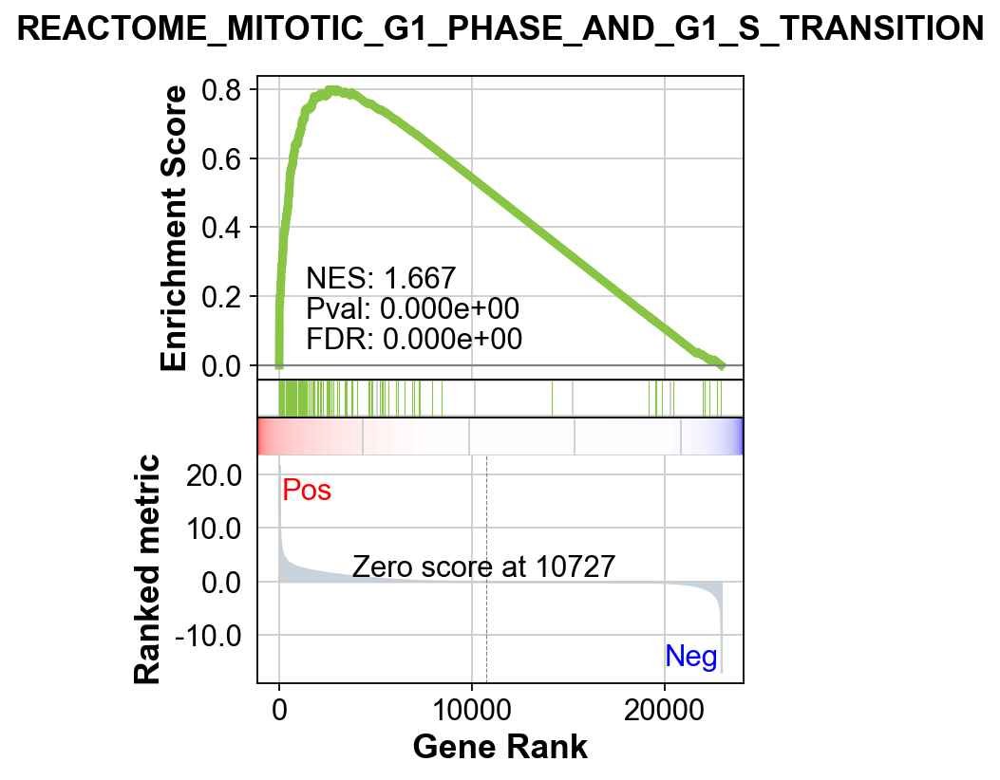

In [113]:
terms = Mac_mono_pre_res_CP_1_sorted.Term
axs = Mac_mono_pre_res_CP.plot(terms=terms[0]) # v1.0.5
# axs.savefig("Mac_mono_GSEApy_CP_IL1_pathway.pdf", bbox_inches = 'tight')

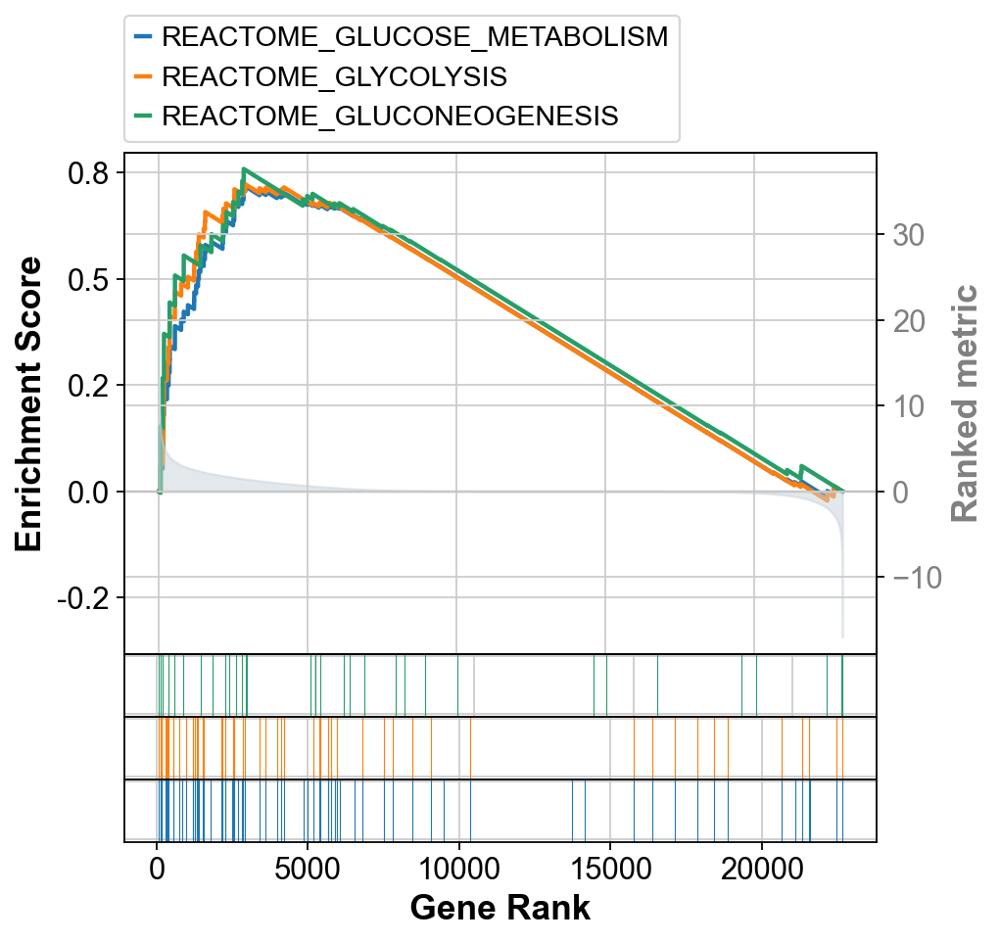

In [117]:
axs = Mac_mono_pre_res_CP.plot(terms=[terms[96], terms[113], terms[121]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(7,7)
                                       )

# axs.savefig("Mac_mono_GSEApy_CP_glucose_pathways_updated.pdf", bbox_inches = 'tight')

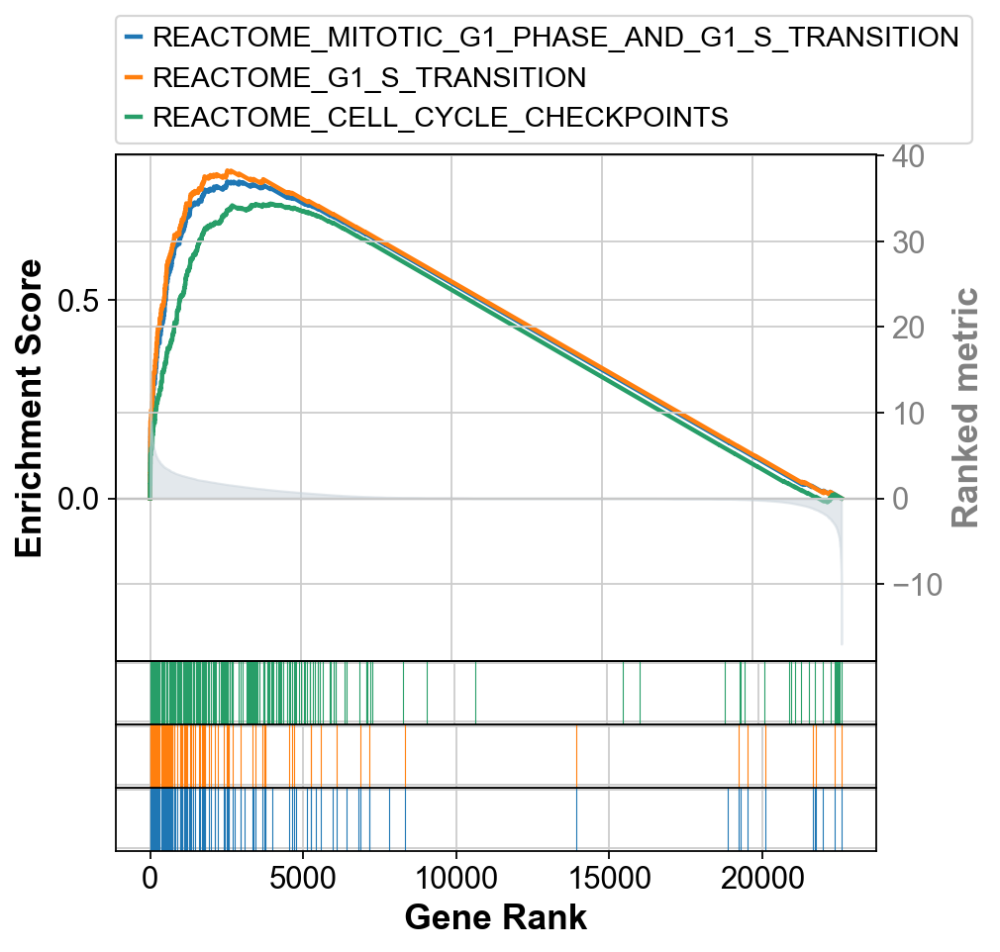

In [119]:
axs = Mac_mono_pre_res_CP.plot(terms=[terms[0], terms[29], terms[60]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(7,7)
                                       )

# axs.savefig("Mac_mono_GSEApy_CP_cell_cycle_updated.pdf", bbox_inches = 'tight')

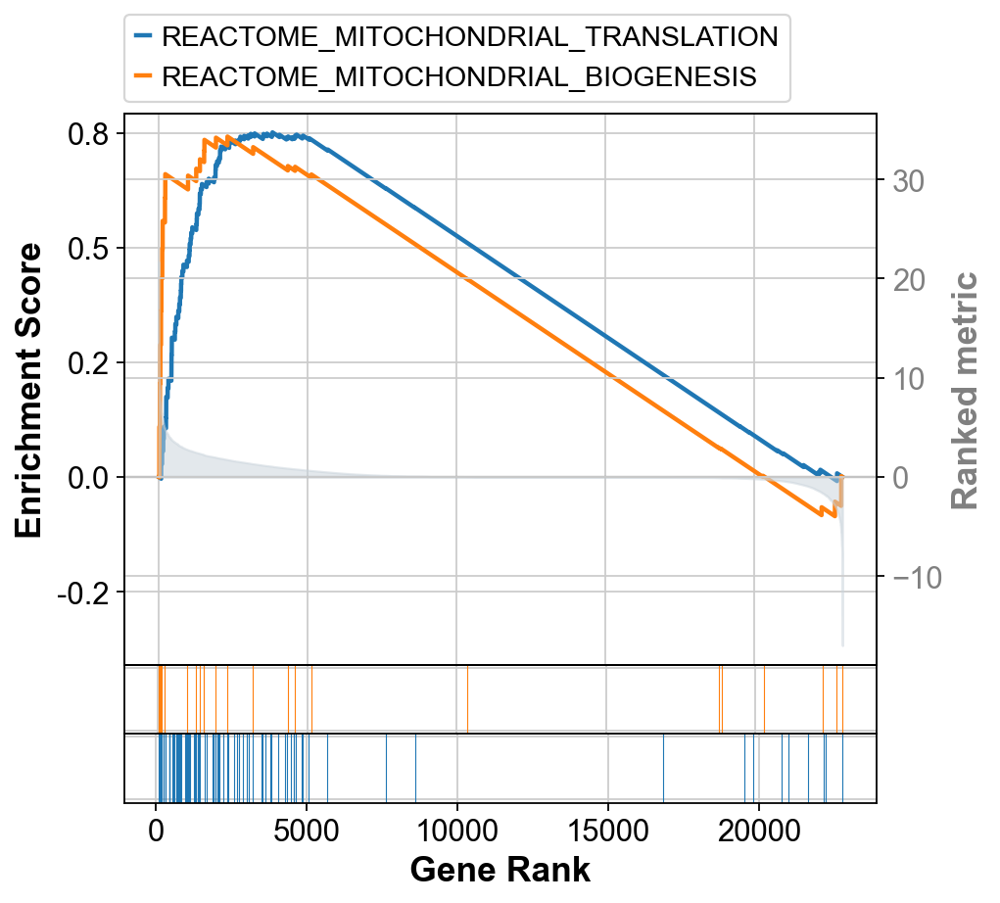

In [124]:
axs = Mac_mono_pre_res_CP.plot(terms=[terms[67], terms[191]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(7,7)
                                       )

# axs.savefig("Mac_mono_GSEApy_CP_cell_cycle_updated.pdf", bbox_inches = 'tight')

In [83]:
#create custom GSEA list
Mac_mono_pre_res_CP_1_sorted_custom_list = pd.concat([Mac_mono_pre_res_CP_1_sorted[terms==terms[26]],
                                                         Mac_mono_pre_res_CP_1_sorted[terms==terms[27]],
                                                           Mac_mono_pre_res_CP_1_sorted[terms==terms[32]],
                                                           Mac_mono_pre_res_CP_1_sorted[terms==terms[34]],
                                                           Mac_mono_pre_res_CP_1_sorted[terms==terms[53]]],
                                                        ignore_index=True
                                                          )

In [84]:
Mac_mono_pre_res_CP_1_sorted_custom_list

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_REGULATION_OF_MAST_CELL_ACTIVATION,0.790853,2.044322,0.0,0.001274,0.003,16/55,4.46%,Fcer1g;Lilrb4a;Lyn;Cd300a;Ptpre;Fgr;Cd84;Cd300...
1,prerank,GOBP_REGULATION_OF_LEUKOCYTE_DEGRANULATION,0.794528,2.075678,0.0,0.001274,0.002,18/54,2.88%,Fcer1g;Ccr2;Itgam;Lyn;Cd300a;Itgb2;Fgr;Lamp1;C...
2,prerank,GOBP_RESPONSE_TO_INTERFERON_BETA,0.756706,2.049939,0.0,0.001434,0.003,28/69,5.67%,Ifitm3;Ifitm6;Ifitm2;Ifi203;Ifi207;Ifi204;Ifi2...
3,prerank,GOBP_PHAGOCYTOSIS_ENGULFMENT,0.807452,2.08353,0.0,0.001529,0.002,20/58,2.96%,Fcer1g;Itgam;Fcgr3;Sirpa;Cd300a;Itgb2;C3;Msr1;...
4,prerank,GOBP_NEGATIVE_REGULATION_OF_INTERLEUKIN_10_PRO...,0.911118,2.007944,0.0,0.003277,0.012,7/21,1.53%,Tyrobp;Lilrb4a;Vsir;Mmp8;Cd84;Tnfrsf21;Fcgr2b


In [55]:
# add CITE annotation
cite_APRIL_BB = sc.read_h5ad("../2022-12-21 APRIL BB IL-18 single cell experiment/data/internal/10xGenomics/Chromium/BN-2099_group1_CITE/CiteSeq-results/BN-2099_group1.h5ad")
cite_APRIL_BB_IL18 = sc.read_h5ad("../2022-12-21 APRIL BB IL-18 single cell experiment/data/internal/10xGenomics/Chromium/BN-2099_group2_CITE/CiteSeq-results/BN-2099_group2.h5ad")

In [56]:
cite_APRIL_BB.obs.index = cite_APRIL_BB.obs['barcode_sequence']
cite_APRIL_BB_IL18.obs.index = cite_APRIL_BB_IL18.obs['barcode_sequence']

In [57]:
cite_APRIL_BB.obs.index.name = ''
cite_APRIL_BB_IL18.obs.index.name = ''

In [58]:
cite_APRIL_BB.var.index = cite_APRIL_BB.var['feature_name'].values
cite_APRIL_BB_IL18.var.index = cite_APRIL_BB_IL18.var['feature_name'].values

In [59]:
cites = sc.concat(
    [cite_APRIL_BB, cite_APRIL_BB_IL18], # the asterisk unpacks the list containing your AnnData objects. 
    join='outer', 
    label = 'status', 
    keys = ['APRIL-BB', 'APRIL-BB-IL18'], # or use your sample_names list (as used above) here. 
    # Make sure the order of the batch categories matches that of the AnnData objects 
    index_unique = '-1@'
)

In [60]:
cites.var['control']= cites.var_names.str.contains('isotype')

In [61]:
sc.pp.calculate_qc_metrics(
    cites, 
    percent_top=(5,10,15),
    var_type='antibodies',
    qc_vars=('control',),
    inplace=True)

In [62]:
cites.layers['counts']=cites.X.copy()

In [63]:
sc.pp.normalize_total(cites)

normalizing counts per cell
    finished (0:00:00)


In [64]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(cites, n_comps=50,  svd_solver='arpack')
sc.pp.neighbors(cites, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(cites)
sc.tl.leiden(cites, random_state=42, key_added='prot_leiden')

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:33)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:34)
running Leiden clustering
    finished: found 25 clusters and added
    'prot_leiden', the cluster labels (adata.obs, categorical) (0:00:13)


In [65]:
cites.obsp['protein_connectivities'] = cites.obsp['connectivities'].copy()

In [66]:
sc.tl.umap(cites)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:36)


In [67]:
cites.var['feature_name'] =cites.var_names

In [68]:
cites.var.index=cites.var['feature_name']

In [69]:
cites.obs["hash_id"]=Mac_mono.obs["hash_id"]

In [70]:
cites.var.index[:129]

Index(['anti-mouse CD4', 'anti-mouse CD8a', 'anti-mouse CD366 (Tim-3)',
       'anti-mouse CD279 (PD-1)', 'anti-mouse Ly-6C', 'anti-mouse/human CD11b',
       'anti-mouse Ly-6G', 'anti-human/mouse CD49f', 'anti-mouse/human CD44',
       'anti-mouse CD54',
       ...
       'anti-mouse CD159a (NKG2AB6)', 'anti-mouse Ly108', 'anti-mouse CD160',
       'anti-mouse CD85k (gp49 Receptor)', 'anti-mouse CD51',
       'anti-mouse CD94', 'anti-mouse CD205 (DEC-205)',
       'anti-mouse CD155 (PVR)', 'anti-mouse/rat CD81', 'anti-mouse CD45.1'],
      dtype='object', name='feature_name', length=129)

In [71]:
cites.obs['distinct'] = ''
cites.obs['distinct'] = cites.obs[['status', 'hash_id']].agg(' '.join, axis=1)

TypeError: sequence item 1: expected str instance, float found

In [103]:
cites.obs

,unmapped,barcode_sequence,status,n_antibodies_by_counts,log1p_n_antibodies_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_5_antibodies,pct_counts_in_top_10_antibodies,pct_counts_in_top_15_antibodies,total_counts_control,log1p_total_counts_control,pct_counts_control,prot_leiden,hash_id,distinct
,,,,,,,,,,,,,,,,
CAACCAAAGGGCCCTT-1@APRIL-BB,415,CAACCAAAGGGCCCTT,APRIL-BB,112,4.727388,7436,8.914223,59.857450,73.803120,80.984400,3,1.386294,0.040344,13,NaN,
TTCGATTTCGATACAC-1@APRIL-BB,861,TTCGATTTCGATACAC,APRIL-BB,120,4.795791,13776,9.530756,65.672184,78.883566,85.823171,5,1.791759,0.036295,3,NaN,
CGCGTGATCCGAAATC-1@APRIL-BB,467,CGCGTGATCCGAAATC,APRIL-BB,112,4.727388,8828,9.085797,63.400544,75.600362,81.887177,4,1.609438,0.045310,13,NaN,
TACAACGAGTGATAGT-1@APRIL-BB,1839,TACAACGAGTGATAGT,APRIL-BB,124,4.828314,24636,10.112005,47.357526,64.698003,72.909563,7,2.079442,0.028414,20,NaN,
TTGCCTGCACCTAAAC-1@APRIL-BB,253,TTGCCTGCACCTAAAC,APRIL-BB,112,4.727388,4779,8.472196,38.062356,57.396945,70.328521,3,1.386294,0.062775,12,A0303,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GGTGTCGAGCATGGGT-1@APRIL-BB-IL18,2149,GGTGTCGAGCATGGGT,APRIL-BB-IL18,126,4.844187,28962,10.273774,40.470271,53.525309,64.318763,14,2.708050,0.048339,15,NaN,
AGTACTGGTGTTAAAG-1@APRIL-BB-IL18,572,AGTACTGGTGTTAAAG,APRIL-BB-IL18,109,4.700480,4103,8.319717,42.383622,57.884475,68.535218,4,1.609438,0.097490,5,NaN,
GCAGCTGAGATACGAT-1@APRIL-BB-IL18,2405,GCAGCTGAGATACGAT,APRIL-BB-IL18,122,4.812184,12581,9.440023,32.517288,49.407837,61.521342,3,1.386294,0.023845,4,NaN,


In [47]:
# cites_to_h5ad =  '/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/20230519_MM_IL-18_singlecell_cites.h5ad'

In [42]:
# cites.write(cites_to_h5ad)

In [25]:
# # code to read back your saved h5ad object
# cites = sc.read_h5ad(cites_to_h5ad)
# cites.uns['log1p']["base"] = None

In [ ]:
# now we are mapping the CITE data to the Mac_mono object and not the original adata object

In [35]:
Mac_mono.obs

,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,original_total_counts,...,leiden_0.3,leiden_0.4,leiden_0.5,leiden_0.6,leiden_0.7,leiden_0.8,leiden_0.9,leiden_1.0,keep_cell,distinct
TACCTGCTCGGACTTA-1@APRIL-BB,APRIL-BB,3135,8.050703,10482.0,9.257510,23.945812,34.754818,47.519557,63.213127,10482.0,...,2,4,4,2,2,0,2,2,0.yes,APRIL-BB A0302
AAGCATCGTAACTGCT-1@APRIL-BB,APRIL-BB,2918,7.978996,9362.0,9.144521,25.048067,37.096774,49.198889,64.516129,9362.0,...,0,0,0,0,0,2,3,3,0.yes,APRIL-BB A0301
TTGCCTGGTGTTAACC-1@APRIL-BB,APRIL-BB,2664,7.887959,9195.0,9.126524,27.928222,39.815117,52.267537,67.645459,9195.0,...,0,0,0,0,0,2,3,3,0.yes,APRIL-BB A0302
TTCCTCTAGTTCGGTT-1@APRIL-BB,APRIL-BB,2974,7.997999,9620.0,9.171703,27.234927,38.638254,50.051975,64.490644,9620.0,...,0,0,0,0,0,1,0,0,0.yes,APRIL-BB A0303
TACCGGGCACAACGCC-1@APRIL-BB,APRIL-BB,5136,8.544225,28614.0,10.261686,24.760607,36.901517,48.710421,62.410009,28614.0,...,1,1,1,7,4,8,9,8,0.yes,APRIL-BB A0303
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGACAGCGTTCAGCTA-1@APRIL-BB-IL18,APRIL-BB-IL18,4476,8.406708,25506.0,10.146708,30.161531,40.629656,51.983847,66.799969,25506.0,...,1,1,1,5,1,5,1,6,0.yes,APRIL-BB-IL18 A0301
TCGTAGATCTTCCCAG-1@APRIL-BB-IL18,APRIL-BB-IL18,4388,8.386857,25308.0,10.138915,37.608661,47.099731,57.274380,69.298246,25308.0,...,5,5,5,4,5,4,11,11,0.yes,APRIL-BB-IL18 A0303
ACACGCGAGGTACATA-1@APRIL-BB-IL18,APRIL-BB-IL18,2800,7.937732,9901.0,9.200492,27.078073,39.187961,52.146248,67.892132,9901.0,...,0,0,0,0,0,1,0,0,0.yes,APRIL-BB-IL18 A0302
AACAGGGTCCTTATAC-1@APRIL-BB-IL18,APRIL-BB-IL18,3309,8.104703,11945.0,9.388152,23.700293,33.629134,46.278778,62.637087,11945.0,...,0,0,0,0,0,2,3,3,0.yes,APRIL-BB-IL18 A0302


In [36]:
# del Mac_mono.obs['doublet_score']
# del Mac_mono.obs['predicted_doublet']

In [104]:
mu.set_options(display_style="html", display_html_expand=0b000);

In [105]:
import muon as mu
from muon import MuData
from muon import prot as pt

In [106]:
mdata_Mac_mono = MuData({"rna": Mac_mono, "prot": cites})

In [107]:
# we can use existing code to call cell types (based on leiden), then create new Muobject named that specific cell type

In [108]:
mdata_Mac_mono.update_var()


In [109]:
mdata_Mac_mono.update_obs()


In [110]:
mu.pp.intersect_obs(mdata_Mac_mono)


In [111]:
mdata_Mac_mono

IndexError: string index out of range

MuData object with n_obs × n_vars = 1643 × 23085
  var:	'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
  2 modalities
    rna:	1643 x 22956
      obs:	'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'original_total_counts', 'log10_original_total_counts', 'mito_frac', 'ribo_frac', 'hb_frac', 'hash_id', 'doublet_score', 'predicted_doublet', 'n_counts', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'leiden_0.6', 'leiden_0.7', 'leiden_0.8', 'leiden_0.9', 'leiden_1.0', 'keep_cell', 'distinct', 'Mac_M1', 'Mac_activation'
      var:	'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'n_cells', 'highly_variable', 'means', 'dispersions', 'disper

In [114]:
cites = mdata_Mac_mono.mod['prot']

In [45]:
rng = np.random.RandomState(42) # set seed 
sc.tl.pca(cites, n_comps=50,  svd_solver='arpack')
sc.pp.neighbors(cites, n_neighbors=15, random_state=42) # set seed
sc.tl.umap(cites)


computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


running Leiden clustering
    finished: found 3 clusters and added
    'prot_leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'prot_leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'prot_leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'prot_leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'prot_leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'prot_leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'prot_leiden_0.7', the cluster labels (adata.obs, categorical) (

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

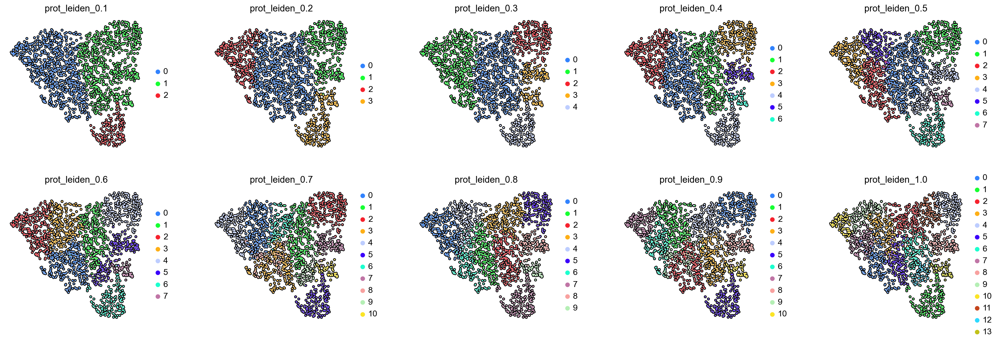

In [46]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(cites, resolution=resolution_parameter, random_state=42, 
                        key_added='prot_leiden_'+str(resolution_parameter))

sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    cites, 
    color=['prot_leiden_0.1', 'prot_leiden_0.2', 'prot_leiden_0.3', 'prot_leiden_0.4', 'prot_leiden_0.5', 
           'prot_leiden_0.6', 'prot_leiden_0.7', 'prot_leiden_0.8', 'prot_leiden_0.9', 'prot_leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r',
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [115]:
mdata_Mac_mono.update_var()


In [116]:
mdata_Mac_mono.update_obs()


In [117]:
mu.pp.intersect_obs(mdata_Mac_mono)


In [193]:
mu.tl.leiden(mdata_Mac_mono, resolution=[0.9, 0.5], random_state=42)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


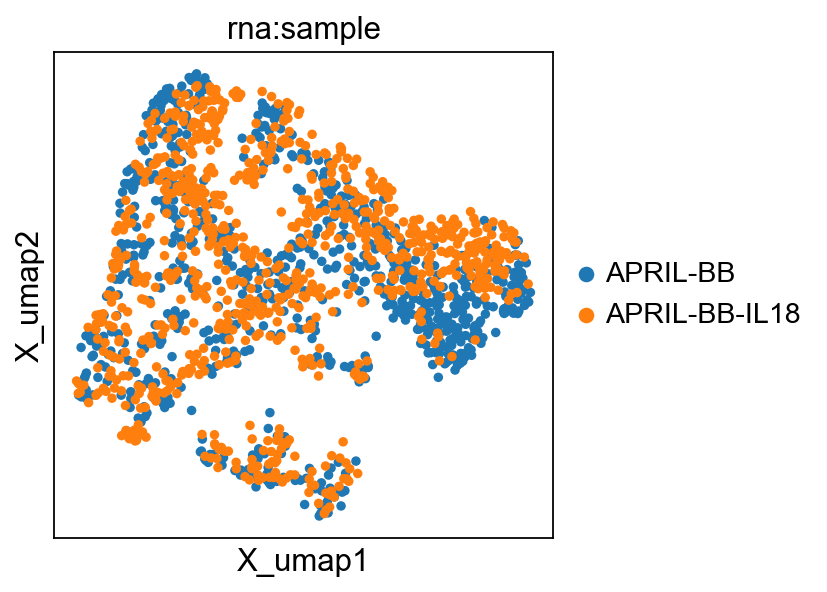

In [118]:
mu.pl.embedding(mdata_Mac_mono, basis="rna:X_umap", color="rna:sample")


In [119]:
cites.var["highly_variable"] = True
mdata_Mac_mono.update()

In [140]:
cites.var

,control,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,feature_name,highly_variable
feature_name,,,,,,,,,
anti-mouse CD4,False,41192,69.717375,4.258691,2.635498,2949533,14.897158,anti-mouse CD4,True
anti-mouse CD8a,False,33697,12.997518,2.638880,20.351242,549886,13.217468,anti-mouse CD8a,True
anti-mouse CD366 (Tim-3),False,40835,8.660458,2.268041,3.479330,366398,12.811478,anti-mouse CD366 (Tim-3),True
anti-mouse CD279 (PD-1),False,40962,11.214504,2.502624,3.179143,474452,13.069918,anti-mouse CD279 (PD-1),True
anti-mouse Ly-6C,False,42303,325.574964,5.788660,0.009455,13774100,16.438301,anti-mouse Ly-6C,True
anti-mouse/human CD11b,False,42300,717.885244,6.577702,0.016546,30371571,17.229018,anti-mouse/human CD11b,True
anti-mouse Ly-6G,False,42300,969.018862,6.877316,0.016546,40996281,17.528992,anti-mouse Ly-6G,True
anti-human/mouse CD49f,False,42287,63.175243,4.161618,0.047274,2672755,14.798621,anti-human/mouse CD49f,True
anti-mouse/human CD44,False,42305,650.980972,6.480015,0.004727,27541052,17.131188,anti-mouse/human CD44,True


In [121]:
Mac_mono_cite_markers = ['anti-mouse CD45.2', 'anti-mouse F4/80', 'anti-mouse CD68', 'anti-mouse/human CD11b',
                         'anti-mouse Ly-6C', 'anti-mouse CD115 (CSF-1R)', 'anti-mouse CD11c', 'anti-mouse CD103','anti-mouse I-A/I-E',
                         'anti-mouse Ly-6G', 'anti-mouse CD200 (OX2)', 'anti-mouse Fc{GREEK SMALL LETTER EPSILON}RI{GREEK SMALL LETTER ALPHA}',
                         'anti-mouse CD274 (B7-H1, PD-L1)', 'anti-mouse CD86', 'anti-mouse CD163', 'anti-mouse CD170 (Siglec-F)',
                        'anti-mouse CD169/Siglec-1', 'anti-mouse CD301a', 'anti-mouse CD301b', 'anti-mouse/rat XCR1'
                        ]


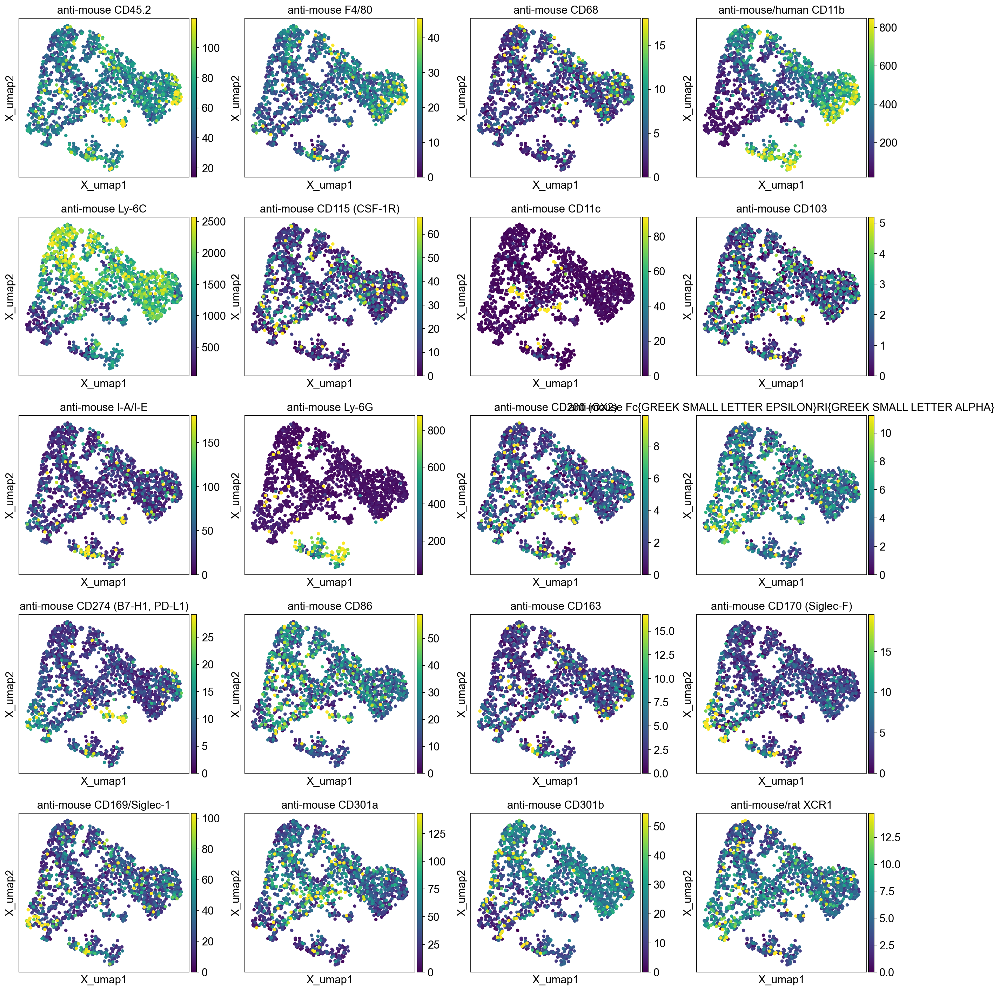

In [142]:
mu.pl.embedding(mdata_Mac_mono, basis="rna:X_umap", color=Mac_mono_cite_markers, use_raw=False, vmax='p98')


In [131]:
cites.obsm['X_umap_rna']=mdata_Mac_mono.mod['rna'].obsm['X_umap']

In [1]:
# graphing RNA UMAP with cite markers

mu.pl.embedding(mdata_Mac_mono[mdata_Mac_mono.mod['rna'].obs['sample']=='APRIL-BB'], 
                basis="rna:X_umap", 
                color=['anti-mouse I-A/I-E'], 
                 cmap='Reds',
                use_raw=True, 
                size=300,
#                 layer='prot:mean_counts',
#                 vmin=30,
                vmax=1000, 
#                 save="_Mac_mono_cite_APRIL_BB_MHCII.pdf"
               )

mu.pl.embedding(mdata_Mac_mono[mdata_Mac_mono.mod['rna'].obs['sample']=='APRIL-BB-IL18'],
                basis="rna:X_umap",
                color=['anti-mouse I-A/I-E'],
                cmap='Reds',
                use_raw=True,
                size=300,
#                 layer='prot:mean_counts',
#                 vmin=30,
                vmax=1000,
#                 save="_Mac_mono_cite_APRIL_BB_IL18_MHCII.pdf"
               )

In [ ]:
# Dendritic cells

In [29]:
DCs = adata[(adata.obs['leiden_0.8']=='16') | (adata.obs['leiden_0.8']=='17')]

In [71]:
sc.pp.highly_variable_genes(DCs, n_top_genes=2000, n_bins=20, flavor='seurat',  inplace=True)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [72]:
# rerun PCA for new cell type
rng = np.random.RandomState(42)
DCs = sc.tl.pca(DCs, n_comps=200, copy = True, svd_solver='arpack', random_state=rng)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:01)


<function matplotlib.pyplot.show(close=None, block=None)>

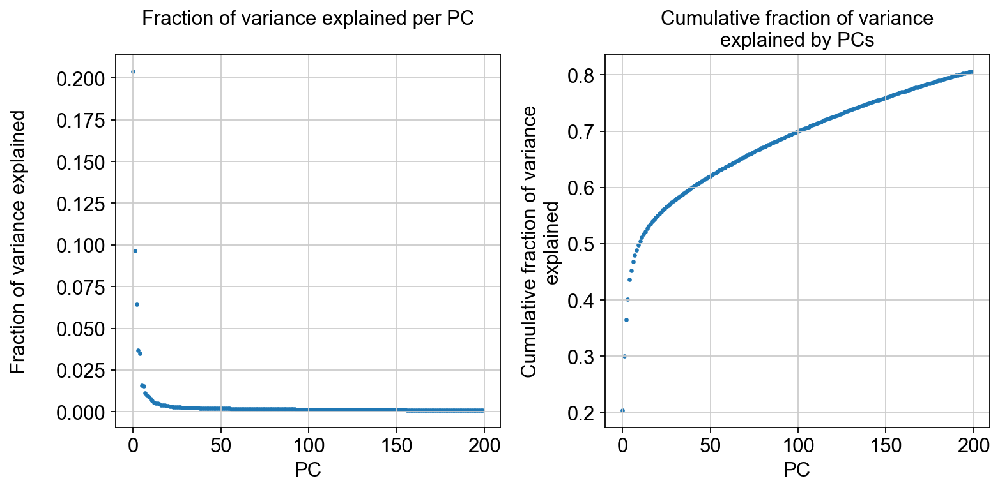

In [73]:
observe_variance(DCs)

In [74]:
rng = np.random.RandomState(42) # use seed
sc.tl.pca(DCs, n_comps=45, svd_solver='arpack', random_state=rng)
sc.pp.neighbors(DCs, n_neighbors=15)
sc.tl.umap(DCs)

computing PCA
    on highly variable genes
    with n_comps=45
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 45
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


In [75]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(DCs, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clusterin

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:379: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:369: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8

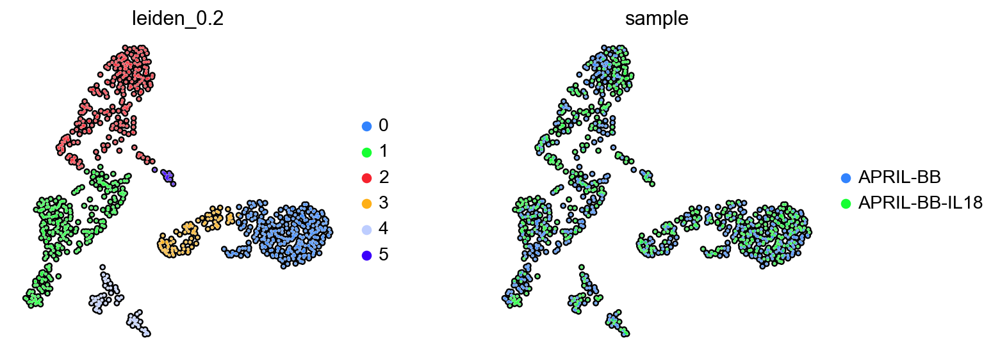

In [76]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    DCs, 
    color=['leiden_0.2', 'sample'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = False
)

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


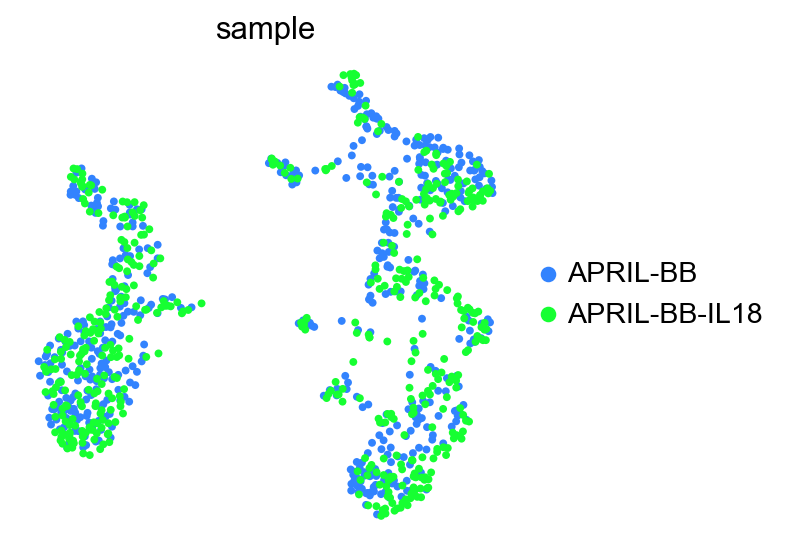

In [33]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=False, transparent=True)
sc.pl.umap(
    DCs, 
    color='sample', 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    size=50,
    frameon=False,
    add_outline=False,
    sort_order = False
)

In [34]:
#to add group and HTO distinctions
DCs.obs['distinct'] = ''
DCs.obs['distinct'] = DCs.obs[['sample', 'hash_id']].agg(' '.join, axis=1)

In [35]:
DCs_to_h5ad = '../2022-12-21 APRIL BB IL-18 single cell experiment/DCs.h5ad'


In [36]:
# DCs.write(DCs_to_h5ad)

In [37]:
# code to read back your saved h5ad object
DCs = sc.read_h5ad(DCs_to_h5ad)
DCs.uns['log1p']["base"] = None

In [38]:
DC_antigen_presentation_genes = ['H2-D1', 'H2-T23', 'B2m', 'H2-K1', 'Tap1']

cDC1_activation_genes = ['Cd80', 'Cd86', 'Cd8a', 'Irf8', 'Irf7', 'Socs1', 'Clec9a', 'Xcr1', 'Itgae', 'Zbtb46']

DC_combined_genes = ['H2-D1', 'H2-T23', 'B2m', 'H2-K1', 'Tap1', 'Irf8', 'Irf7']

/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


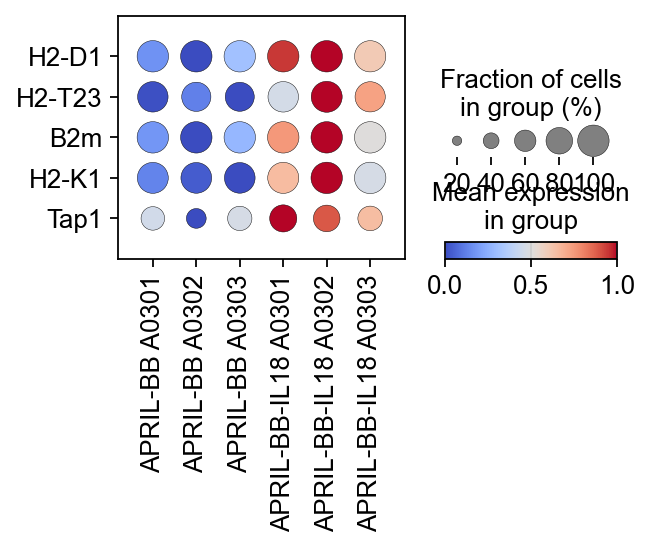

In [40]:
# this will make heatmap (matrixplot) with average data as opposed to each cell being visualized
ax_DCs = sc.pl.dotplot(DCs, DC_antigen_presentation_genes , groupby='distinct', figsize=(4, 2), cmap='coolwarm', standard_scale='var', use_raw=False, dendrogram=False, swap_axes=True)


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


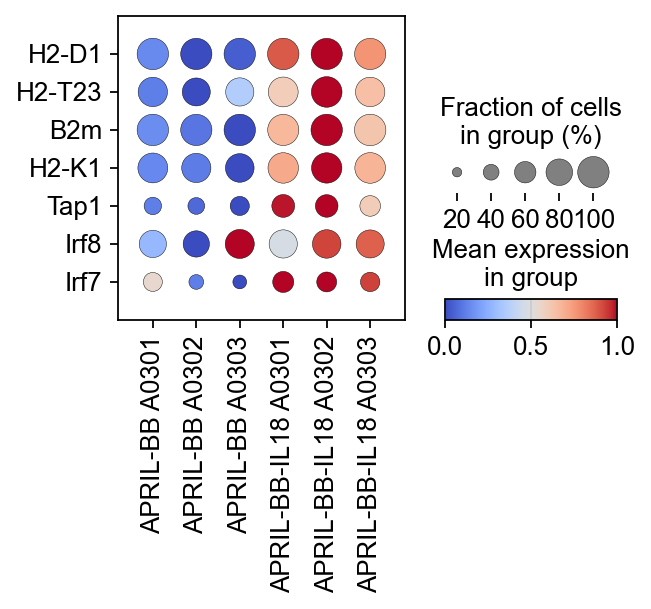

In [52]:
ax_DCs = sc.pl.dotplot(DCs, DC_combined_genes , groupby='distinct', figsize=(4, 2.5), cmap='coolwarm', 
                       standard_scale='var', use_raw=False, dendrogram=False, swap_axes=True,
                      save="DC_genes.pdf"
                      )

In [50]:
sc.tl.rank_genes_groups(DCs, 'sample', method='wilcoxon', use_raw=False)

ranking genes


/Users/brandonng/opt/anaconda3/envs/updated_BDN_MM_IL18/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [51]:
result = DCs.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names']}).head(5)

,APRIL-BB_n,APRIL-BB-IL18_n
0,S100a9,H2-D1
1,Retnlg,Psmb9
2,Camp,H2-T23
3,S100a8,Psmb8
4,Ngp,Zbp1


In [41]:
writer = pd.ExcelWriter('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/DCs_wilcox2.xlsx', engine='xlsxwriter')

sc.tl.rank_genes_groups(DCs, 'sample', method='wilcoxon', use_raw=False)
result = DCs.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals_adj']}).to_excel(writer, sheet_name='DCs')
        
writer.close()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


In [ ]:
#Gsea analysis with gseapy

In [45]:
import gseapy
from matplotlib import pyplot as plt

In [89]:
sc.tl.rank_genes_groups(DCs, 'sample', method='wilcoxon', use_raw=False, key_added = "wilcoxon")
result = DCs.uns['rank_genes_groups']
groups = result['names'].dtype.names

ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [ ]:
# plotting GSEA results together from rank list using gseapy

In [42]:
df = pd.read_csv('/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/DCs_wilcox2_rnk.txt',
                 sep='\t', header=0)


In [43]:
df

,#primer_id,#rank_score
0,Stat1,7.925637
1,Ifi44,7.477753
2,Ifi27l2a,7.359986
3,Tmsb10,7.130221
4,H2-T23,6.740895
...,...,...
22951,Ltf,-9.571106
22952,Ngp,-9.647078
22953,Camp,-10.714598
22954,S100a8,-15.287582


In [46]:
DCs_pre_res_GO_BP = gseapy.prerank(df, min_size=10, seed = 42,
                                gene_sets='/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/GO_BP/m5.go.bp.v2023.1.Mm.symbols.gmt')


2023-07-16 23:35:21,760 [WARNING] Duplicated values found in preranked stats: 59.63% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [47]:
DCs_pre_res_GO_BP_1 = DCs_pre_res_GO_BP

In [48]:
DCs_pre_res_GO_BP_1.res2d.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_GRANULOCYTE_ACTIVATION,-0.759262,-1.990038,0.0,0.06665,0.028,20/47,5.28%,Camp;Ccl5;Anxa3;Anxa1;Ccr2;Myo1f;Itgam;Itgb2;S...
1,prerank,GOBP_GRANULOCYTE_CHEMOTAXIS,-0.659969,-1.971952,0.0,0.049482,0.041,41/122,9.50%,S100a9;S100a8;Ccl5;Anxa1;Fcgr3;Itgam;Il17ra;Cs...
2,prerank,GOBP_PEPTIDE_CROSS_LINKING,-0.803064,-1.965349,0.0,0.040394,0.051,10/38,4.55%,Cstdc5;Anxa1;Cstdc4;Abca7;Fn1;Stfa2l1;F13a1;St...
3,prerank,GOBP_GRANULOCYTE_MIGRATION,-0.643467,-1.958292,0.0,0.03383,0.057,41/149,5.76%,S100a9;S100a8;Ccl5;Anxa1;Fcgr3;Myo1f;Itgam;Il1...
4,prerank,GOBP_CHRONIC_INFLAMMATORY_RESPONSE,-0.895339,-1.949156,0.0,0.033123,0.068,6/19,2.46%,S100a9;Camp;Cx3cr1;Nfkbiz;Cebpb;Tnfaip3
5,prerank,GOBP_ASTROCYTE_DEVELOPMENT,-0.795752,-1.945483,0.0,0.031978,0.077,7/35,1.56%,S100a9;S100a8;Ifngr1;Csf1r;C5ar1;Lrp1;Il1b
6,prerank,GOBP_MYELOID_LEUKOCYTE_MIGRATION,-0.627979,-1.942673,0.0,0.029141,0.081,78/224,9.83%,S100a9;S100a8;Retnlg;Ccl5;Anxa1;Ccr2;Pla2g7;Fc...
7,prerank,GOBP_LEUKOCYTE_MIGRATION_INVOLVED_IN_INFLAMMAT...,-0.866251,-1.936161,0.0,0.028781,0.089,9/25,3.79%,S100a9;S100a8;Itgam;Elane;Itgb2;Slamf8;Adam8;R...
8,prerank,GOBP_LEUKOCYTE_CHEMOTAXIS,-0.603809,-1.922639,0.0,0.035681,0.124,70/216,9.50%,S100a9;S100a8;Retnlg;Ccl5;Anxa1;Ccr2;Cxcl16;Pl...
9,prerank,GOBP_REGULATION_OF_MORPHOGENESIS_OF_AN_EPITHELIUM,-0.69288,-1.915092,0.0,0.037162,0.145,12/65,5.68%,Lcn2;Foxp1;Phb2;Itgax;Pik3cd;Maged1;Etv5;Fgfr1...


In [49]:
DCs_pre_res_GO_BP_1_sorted = DCs_pre_res_GO_BP_1.res2d.sort_values('FDR q-val', ascending = True).reset_index(drop = True)


In [75]:
# gseapy.gseaplot(rank_metric=res.ranking, term=terms[13], **res.results[terms[13]],
               
#                )

In [50]:
DCs_pre_res_GO_BP_1_sorted.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,GOBP_PROTON_MOTIVE_FORCE_DRIVEN_ATP_SYNTHESIS,0.788105,1.750099,0.0,0.002361,0.01,45/67,7.66%,Atp5j2;Atp5e;Ndufa1;Ndufa5;Ndufb7;Sdhc;Ndufc1;...
1,prerank,GOBP_CELLULAR_RESPONSE_TO_INTERFERON_BETA,0.784905,1.752875,0.0,0.002422,0.007,28/57,10.79%,Stat1;Mndal;Irgm1;Ifi47;Iigp1;Ifi211;Ndufa13;I...
2,prerank,GOBP_PROTEIN_FOLDING,0.724336,1.755507,0.0,0.003269,0.007,88/164,16.67%,B2m;Hspa5;Dnaja1;Stip1;Ppih;Dnajc3;Calr;Hsph1;...
3,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_VIA_M...,0.851904,1.73374,0.0,0.004068,0.024,10/32,2.61%,H2-T23;B2m;H2-D1;H2-K1;H2-T22;H2-Q7;H2-Q6;H2-Q...
4,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_EN...,0.847077,1.757183,0.0,0.005086,0.005,12/35,2.61%,H2-T23;B2m;H2-D1;H2-K1;H2-T22;Tap1;H2-Q7;H2-Q6...
5,prerank,GOBP_OXIDATIVE_PHOSPHORYLATION,0.721511,1.721716,0.0,0.005933,0.044,61/136,4.87%,Cox7a2;Atp5j2;Cox6c;Atp5e;Cox7c;Ndufa1;Uqcr10;...
6,prerank,GOBP_ANTIGEN_PROCESSING_AND_PRESENTATION_OF_PE...,0.795443,1.707787,0.0,0.007265,0.07,17/43,5.22%,H2-T23;B2m;H2-D1;H2-K1;H2-T22;Tap1;H2-Q7;H2-Q6...
7,prerank,GOBP_PROTEIN_TARGETING_TO_MITOCHONDRION,0.747575,1.708298,0.0,0.007888,0.066,37/74,10.35%,Tomm7;Tomm70a;Romo1;Tomm34;Timm17a;Timm23;Nduf...
8,prerank,GOBP_AEROBIC_RESPIRATION,0.701362,1.694688,0.0,0.008863,0.103,85/179,8.94%,Cox7a2;Atp5j2;Cox6c;Atp5e;Cox7c;Ndufa1;Uqcr10;...
9,prerank,GOBP_PROTEIN_REFOLDING,0.898215,1.696836,0.0,0.009364,0.099,9/19,2.98%,B2m;Hspa5;Dnaja1;Hspa8;St13;Hspa9;Hsp90aa1;Dna...


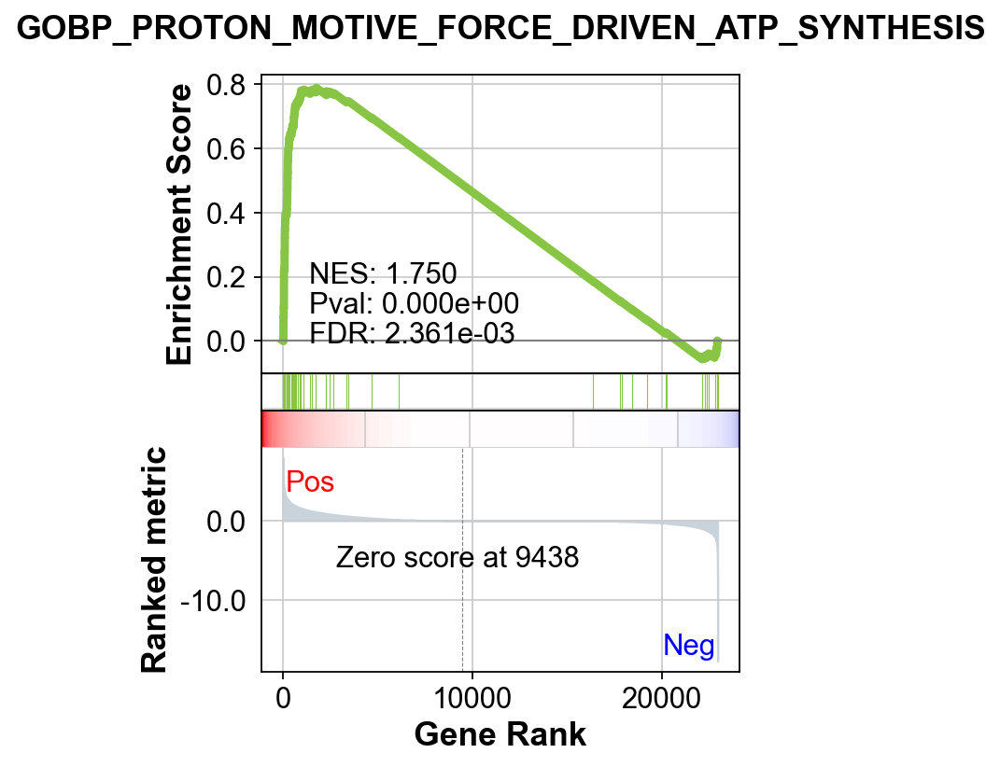

In [52]:
terms = DCs_pre_res_GO_BP_1_sorted.Term
axs = DCs_pre_res_GO_BP.plot(terms=terms[0]) # v1.0.5

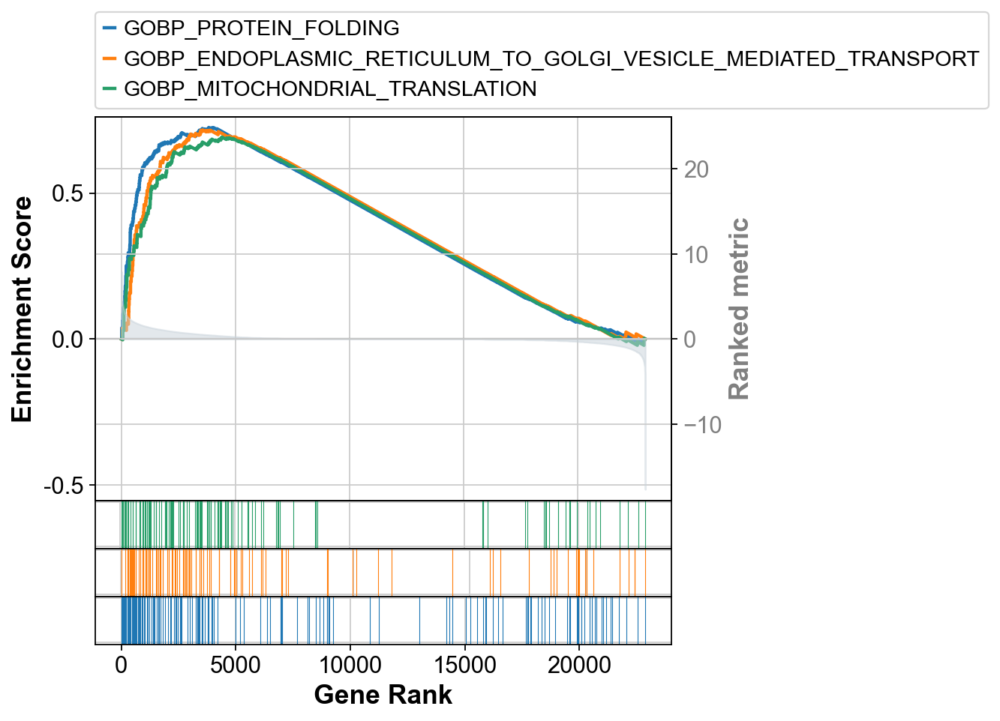

In [59]:
axs = DCs_pre_res_GO_BP.plot(terms=[terms[2], terms[10], terms[17]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(3,4)
                  )

# axs.savefig("DCs_GSEApy_GO_BP_protein_production.pdf", bbox_inches = 'tight')

<Axes: title={'center': 'GO_Biological_Process_2023'}, xlabel='$- \\log_{10}$ (FDR q-val)'>

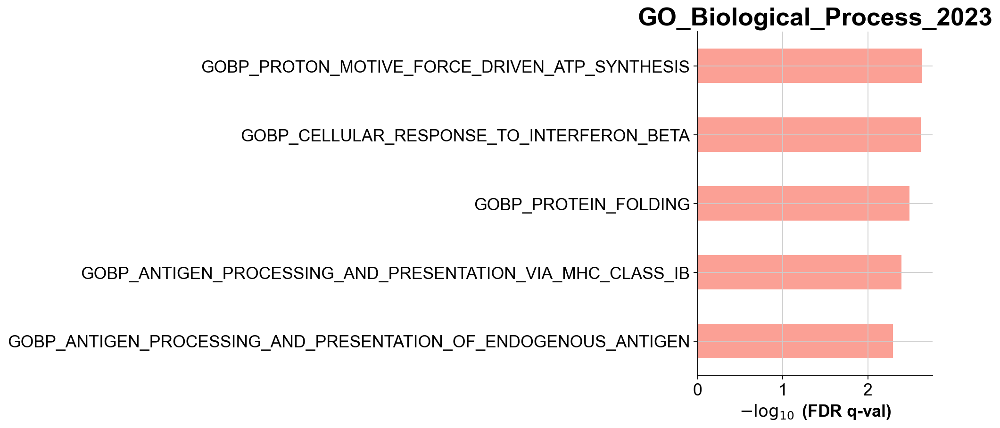

In [62]:
gseapy.barplot(DCs_pre_res_GO_BP.res2d, column = 'FDR q-val', cutoff = 0.05, top_term=5, title='GO_Biological_Process_2023',
#               save="T_cells_gseapy_GO_BP.pdf"
              )

In [63]:
DCs_pre_res_biocarta_CP = gseapy.prerank(df, min_size=10, seed = 42,
                                gene_sets='/Users/brandonng/Google Drive/Weill Cornell/LAB/folder containing all data from Mac pro/experiments and data/single cell/2022-12-21 APRIL BB IL-18 single cell experiment/gsea results/biocarta_CP/m2.cp.v2023.1.Mm.symbols.gmt')


2023-07-17 00:10:43,664 [WARNING] Duplicated values found in preranked stats: 59.63% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [64]:
DCs_pre_res_biocarta_CP_1 = DCs_pre_res_biocarta_CP

In [65]:
DCs_pre_res_biocarta_CP_1.res2d.head(100)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_ANTIMICROBIAL_PEPTIDES,-0.896048,-2.267625,0.0,0.0,0.0,10/43,2.16%,S100a9;S100a8;Camp;Ltf;Lcn2;Lyz2;Pglyrp1;Elane...
1,prerank,REACTOME_ACTIVATION_OF_MATRIX_METALLOPROTEINASES,-0.841405,-1.939241,0.0,0.014073,0.023,7/28,7.33%,Mmp9;Elane;Mmp8;Timp2;Ctsg;Mmp25;Mmp14
2,prerank,REACTOME_RHO_GTPASES_ACTIVATE_NADPH_OXIDASES,-0.872214,-1.938794,0.0,0.009382,0.023,11/22,3.17%,S100a9;S100a8;Cybb;Prkcb;Ncf2;Mapk14;Ncf4;Mapk...
3,prerank,REACTOME_DEGRADATION_OF_THE_EXTRACELLULAR_MATRIX,-0.674886,-1.919126,0.0,0.010262,0.031,18/97,7.33%,Mmp9;Elane;Fn1;Mmp8;Timp2;Ctss;Adam8;Ctsg;Capn...
4,prerank,REACTOME_PHOSPHORYLATION_OF_CD3_AND_TCR_ZETA_C...,-0.85541,-1.910231,0.0,0.01079,0.039,13/21,6.56%,Cd3d;Cd3e;H2-Aa;Ptprj;Ptprc;Cd3g;Trbc1;Trbc2;H...
5,prerank,REACTOME_TRANSLOCATION_OF_ZAP_70_TO_IMMUNOLOGI...,-0.861438,-1.888174,0.0,0.013487,0.054,12/18,8.99%,Cd3d;Cd3e;H2-Aa;Cd3g;Trbc1;Trbc2;H2-Eb1;Trac;C...
6,prerank,REACTOME_PEPTIDE_LIGAND_BINDING_RECEPTORS,-0.63822,-1.877808,0.0,0.015581,0.071,28/139,12.69%,Ccl5;Anxa1;Cxcl16;Cx3cr1;Ccl6;Ccl9;C5ar1;C3ar1...
7,prerank,REACTOME_MRNA_SPLICING,0.755965,1.864291,0.0,0.0,0.0,139/201,14.68%,Snrpf;Snrpg;Ubl5;Snrpd1;Srsf9;Sf3a3;Gtf2f1;Ppi...
8,prerank,REACTOME_PROCESSING_OF_CAPPED_INTRON_CONTAININ...,0.738294,1.839261,0.0,0.0,0.0,161/267,13.04%,Snrpf;Snrpg;Ubl5;Snrpd1;Srsf9;Sf3a3;Gtf2f1;Ppi...
9,prerank,REACTOME_COMPLEMENT_CASCADE,-0.637542,-1.833125,0.0,0.031665,0.154,13/118,14.06%,Cd81;Elane;C5ar1;C3ar1;Ighg1;Fcnb;Cd55;C1qb;Ig...


In [66]:
DCs_pre_res_biocarta_CP_1_sorted = DCs_pre_res_biocarta_CP_1.res2d.sort_values('FDR q-val', ascending = True).reset_index(drop = True)


In [75]:
# gseapy.gseaplot(rank_metric=res.ranking, term=terms[13], **res.results[terms[13]],
               
#                )

In [67]:
DCs_pre_res_biocarta_CP_1_sorted.head(200)

,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,REACTOME_ANTIMICROBIAL_PEPTIDES,-0.896048,-2.267625,0.0,0.0,0.0,10/43,2.16%,S100a9;S100a8;Camp;Ltf;Lcn2;Lyz2;Pglyrp1;Elane...
1,prerank,REACTOME_MRNA_SPLICING,0.755965,1.864291,0.0,0.0,0.0,139/201,14.68%,Snrpf;Snrpg;Ubl5;Snrpd1;Srsf9;Sf3a3;Gtf2f1;Ppi...
2,prerank,REACTOME_PROCESSING_OF_CAPPED_INTRON_CONTAININ...,0.738294,1.839261,0.0,0.0,0.0,161/267,13.04%,Snrpf;Snrpg;Ubl5;Snrpd1;Srsf9;Sf3a3;Gtf2f1;Ppi...
3,prerank,REACTOME_ER_PHAGOSOME_PATHWAY,0.917849,1.823125,0.0,0.0,0.0,14/27,2.61%,H2-T23;B2m;H2-K1;H2-T22;Tap1;H2-Q7;H2-Q6;Tapbp...
4,prerank,REACTOME_TRANSCRIPTIONAL_REGULATION_BY_RUNX2,0.803304,1.78505,0.0,0.000406,0.003,39/61,12.63%,Psme1;Psmb8;Psme2;Psmb10;Psmb2;Uba52;Psma7;Psm...
5,prerank,REACTOME_MAPK6_MAPK4_SIGNALING,0.791495,1.786869,0.0,0.000474,0.003,43/72,12.63%,Psme1;Psmb8;Psme2;Psmb10;Psmb2;Uba52;Psma7;Psm...
6,prerank,REACTOME_THE_ROLE_OF_GTSE1_IN_G2_M_PROGRESSION...,0.788598,1.796569,0.0,0.000474,0.002,44/73,12.63%,Psme1;Psmb8;Psme2;Psmb10;Psmb2;Uba52;Psma7;Psm...
7,prerank,REACTOME_RESPIRATORY_ELECTRON_TRANSPORT_ATP_SY...,0.743345,1.754045,0.0,0.000569,0.006,67/117,7.66%,Atp5j2;Atp5e;Cox7c;Ndufa4;Ndufa1;Uqcr10;Cox5b;...
8,prerank,REACTOME_ANTIGEN_PRESENTATION_FOLDING_ASSEMBLY...,0.876328,1.790472,0.0,0.000569,0.003,17/34,4.28%,H2-T23;B2m;H2-K1;H2-T22;Tap1;Hspa5;H2-Q7;H2-Q6...
9,prerank,REACTOME_CYCLIN_A_CDK2_ASSOCIATED_EVENTS_AT_S_...,0.767121,1.723927,0.0,0.000577,0.011,40/70,13.16%,Psme1;Psmb8;Psme2;Psmb10;Psmb2;Uba52;Psma7;Psm...


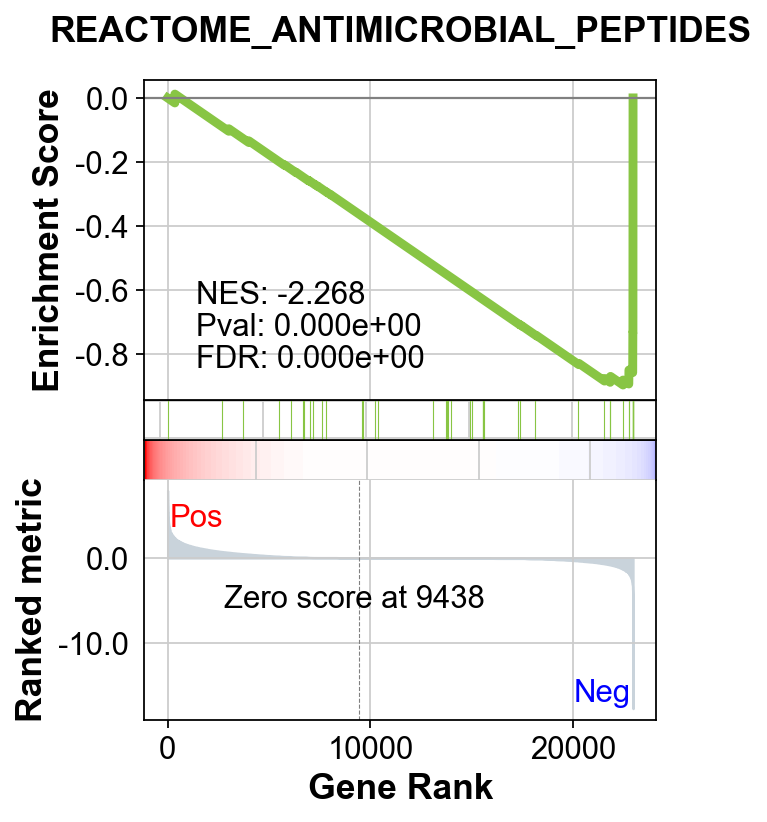

In [68]:
terms = DCs_pre_res_biocarta_CP_1_sorted.Term
axs = DCs_pre_res_biocarta_CP.plot(terms=terms[0]) # v1.0.5
# axs.savefig("DCs_GSEApy_biocarta_CP_IL1_pathway.pdf", bbox_inches = 'tight')

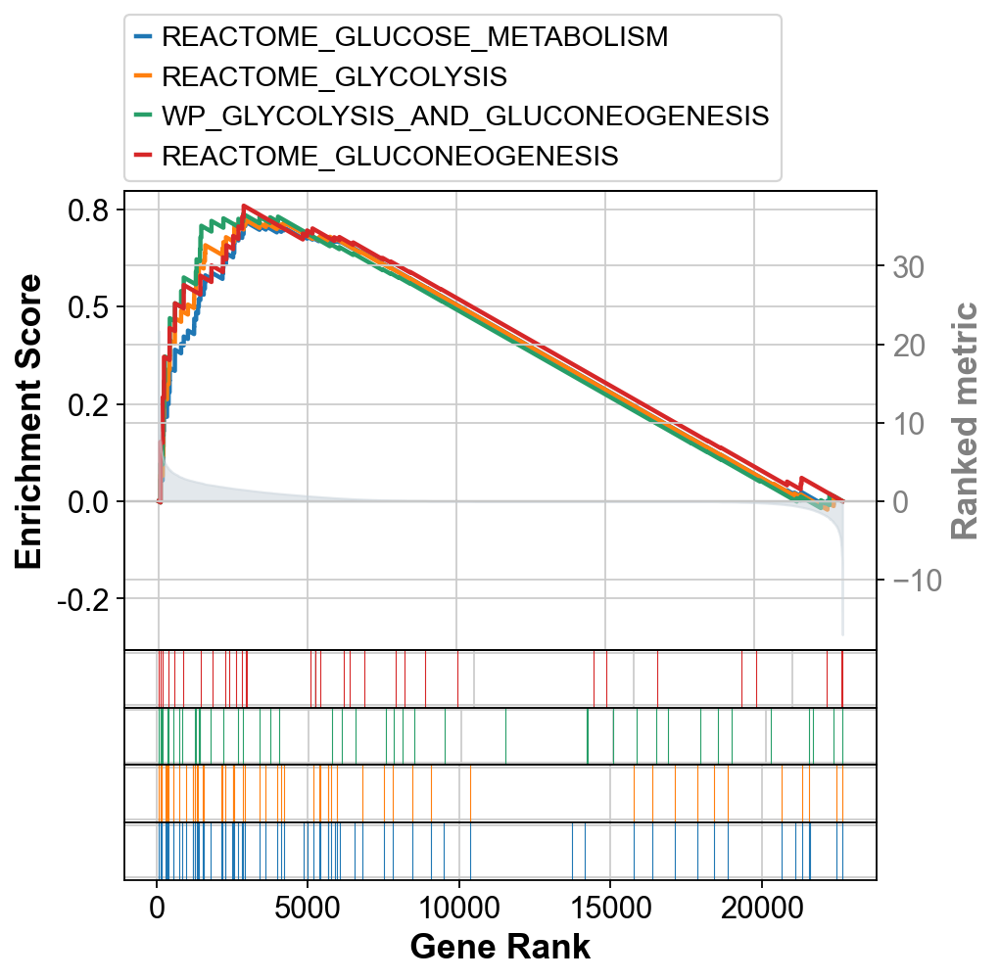

In [135]:
axs = DCs_pre_res_biocarta_CP.plot(terms=[terms[96], terms[113], terms[118], terms[121]],
                   #legend_kws={'loc': (1.2, 0)}, # set the legend loc
                   show_ranking=True, # whether to show the second yaxis
                   figsize=(7,7)
                                       )

# axs.savefig("DCs_GSEApy_biocarta_CP_glucose_pathways.pdf", bbox_inches = 'tight')

<Axes: title={'center': 'Biocarta_CP'}, xlabel='$- \\log_{10}$ (FDR q-val)'>

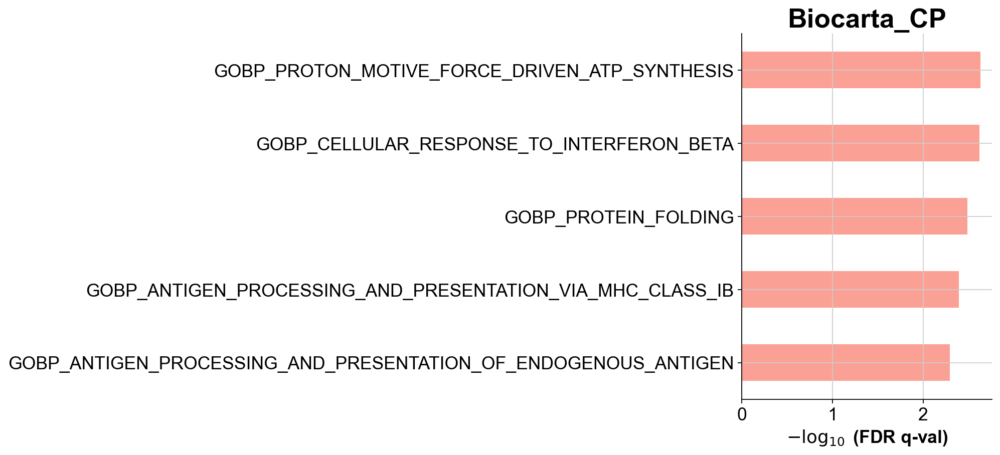

In [61]:
gseapy.barplot(DCs_pre_res_biocarta_CP.res2d, column = 'FDR q-val', cutoff = 0.05, top_term=5, title='Biocarta_CP',
#               save="T_cells_gseapy_GO_BP.pdf"
              )

### 6.2 Visualize the DEA results

💡 Sections initialized with the `%%R` line use R code instead of python. This is to take advantage of some further flexibility that may be available in certain scenarios when creating or plotting the analysis results.

Use the code below to read in the wilcoxon saved results from the shunPykeR_wilcox.xlsx file and store the appropriate fields in a long format.

In [143]:
%%R

wilcox_results = excel_sheets('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/Macrophages_wilcox_test.xlsx')
wilcox_results_combined = NULL
for (item in wilcox_results) {
    wilcox_result <- read_excel('../2022-12-21 APRIL BB IL-18 single cell experiment/wilcox_distinct/Macrophages_wilcox_test.xlsx', sheet = item)
    colnames(wilcox_result) <- c('index', 'name', 'score', 'log2_fc', 'p_adj')
    wilcox_result$p_adj[wilcox_result$p_adj == 0] <- min(wilcox_result$p_adj[wilcox_result$p_adj>0])
    wilcox_result$`-log10(p_adj)` = -log(wilcox_result$p_adj, 10)
    wilcox_result$subset = item
    wilcox_result_sorted = wilcox_result[order(wilcox_result$score, decreasing = TRUE),]
    wilcox_result_sorted = wilcox_result_sorted[wilcox_result_sorted$p_adj<=0.05,]
    wilcox_results_combined = bind_rows(wilcox_results_combined, wilcox_result_sorted) # select # of top genes per subset 
}

New names:
• `` -> `...1`
New names:
• `` -> `...1`


Use R's `ggdotchart` function from the ggpubr package (https://rpkgs.datanovia.com/ggpubr/reference/ggdotchart.html) to plot a selection of genes that are differentially expressed in at lease one of our comparisons. 

✍️ Change the list of genes inside the `c()` function to your preferred ones.

In [141]:
%%R
wilcox_results_combined$name

   [1] "Psmb9"         "H2-D1"         "Psmb8"         "H2-K1"        
   [5] "B2m"           "Stat1"         "Tap1"          "Ifi47"        
   [9] "Psme2"         "Psme1"         "Ly6c2"         "Zbp1"         
  [13] "Pnp"           "Gbp7"          "H2-T23"        "Bst2"         
  [17] "Psmb10"        "Isg15"         "H2-Q7"         "Ly6e"         
  [21] "Ifi44"         "Plac8"         "Hspa8"         "Ifi204"       
  [25] "Igtp"          "Irgm1"         "Gbp2b"         "H2-T22"       
  [29] "Fgl2"          "Gbp2"          "H2-Q6"         "Xaf1"         
  [33] "Cycs"          "Ndufb1-ps"     "Irf1"          "Nmi"          
  [37] "Ifi44l"        "Fcgr1"         "Lgals3bp"      "Psma5"        
  [41] "Ifi27l2a"      "Tmsb10"        "Irf7"          "Tomm7"        
  [45] "AW112010"      "Parp12"        "Cox7a2"        "Atp5md"       
  [49] "Ly6c1"         "Cox7b"         "Plaat3"        "H2-Q4"        
  [53] "Ifi202b"       "Atp5j2"        "Nampt"         "Oas3"         
  [57]

In [128]:
%%R
tt

# A tibble: 0 × 8
# … with 8 variables: index <dbl>, name <chr>, score <dbl>, log2_fc <dbl>,
#   p_adj <dbl>, -log10(p_adj) <dbl>, subset <chr>, squished_Zscore <dbl>
# ℹ Use `colnames()` to see all variable names


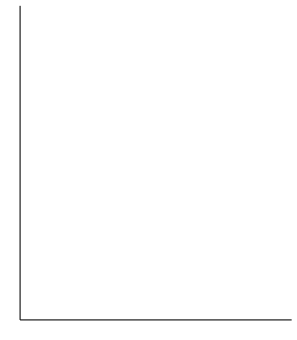

In [142]:
%%R -w 10.5 -h 12 -u cm
tt = wilcox_results_combined[wilcox_results_combined$name %in% c('H2-Ab1', 'H2-D', 'Cd80', 'Cd86', 'H2-Ab1', 'Tnf', 'Nos2', 'Ccl2', 'Il1b', 'Il12b', 'Il6', 'Ifnb1', 'Mrc1'),]
tt$squished_Zscore = squish(tt$score, range=c(-3, 3), only.finite=TRUE)

print(ggdotchart(tt, x='name', y='subset', group = 'group',rotate=TRUE, color='squished_Zscore', size = '-log10(p_adj)', sorting='none', xlab = "",  ylab = "") +
scale_color_gradientn(colours = dichromat::colorschemes$BluetoGreen.14) +  
theme_pubr() + theme(legend.position='right', axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)))
